# Bayesian Optimization

## GPR

In [6]:
# define GPR
from scipy.optimize import minimize
import numpy as np
import matplotlib.pyplot as plt

class GPR:

    def __init__(self, optimize=True):
        self.is_fit = False
        self.train_X, self.train_y = None, None
        self.params = {"l": 1., "sigma_f": 0.1}
        self.optimize = optimize


    def fit(self, X, y):
        # store train data
        self.train_X = np.asarray(X)
        self.train_y = np.asarray(y)

         # hyper parameters optimization
        def negative_log_likelihood_loss(params):
            self.params["l"], self.params["sigma_f"] = params[0], params[1]
            Kyy = self.kernel(self.train_X, self.train_X) + 1e-8 * np.eye(len(self.train_X))
            loss = 0.5 * self.train_y.T.dot(np.linalg.inv(Kyy)).dot(self.train_y) + 0.5 * np.linalg.slogdet(Kyy)[1] + 0.5 * len(self.train_X) * np.log(2 * np.pi)
            return loss.ravel()

        if self.optimize:
            res = minimize(negative_log_likelihood_loss, [self.params["l"], self.params["sigma_f"]],
                   bounds=((1e-4, 1e4), (1e-4, 1e4)),
                   #method='SLSQP')
                   method='L-BFGS-B')
                   #method='Powell')
            self.params["l"], self.params["sigma_f"] = res.x[0], res.x[1]

        self.is_fit = True

    def predict(self, X):
        if not self.is_fit:
            print("GPR Model not fit yet.")
            return

        X = np.asarray(X)
        Kff = self.kernel(self.train_X, self.train_X)  # (N, N)
        Kyy = self.kernel(X, X)  # (k, k)
        Kfy = self.kernel(self.train_X, X)  # (N, k)
        Kff_inv = np.linalg.inv(Kff + 1e-8 * np.eye(len(self.train_X)))  # (N, N)

        mu = Kfy.T.dot(Kff_inv).dot(self.train_y)
        cov = Kyy - Kfy.T.dot(Kff_inv).dot(Kfy)
        return mu, cov

    def kernel(self, x1, x2):
        dist_matrix = np.sum(x1 ** 2, 1).reshape(-1, 1) + np.sum(x2 ** 2, 1) - 2 * np.dot(x1, x2.T)
        return self.params["sigma_f"] ** 2 * np.exp(-0.5 / self.params["l"] ** 2 * dist_matrix)

In [7]:
# define GPR
from scipy.optimize import minimize
import numpy as np
import matplotlib.pyplot as plt

class GPR:

    def __init__(self, optimize=True):
        self.is_fit = False
        self.train_X, self.train_y = None, None
        self.params = {"l": 1., "sigma_f": 0.1}
        self.optimize = optimize


    def fit(self, X, y):
        # store train data
        self.train_X = np.asarray(X)
        self.train_y = np.asarray(y)

         # hyper parameters optimization
        def negative_log_likelihood_loss(params):
            self.params["l"], self.params["sigma_f"] = params[0], params[1]
            Kyy = self.kernel(self.train_X, self.train_X) + 1e-8 * np.eye(len(self.train_X))
            loss = 0.5 * self.train_y.T.dot(np.linalg.inv(Kyy)).dot(self.train_y) + 0.5 * np.linalg.slogdet(Kyy)[1] + 0.5 * len(self.train_X) * np.log(2 * np.pi)
            return loss.ravel()

        if self.optimize:
            res = minimize(negative_log_likelihood_loss, [self.params["l"], self.params["sigma_f"]],
                   bounds=((1e-4, 1e4), (1e-4, 1e4)),
                   #method='SLSQP')
                   method='L-BFGS-B')
                   #method='Powell')
            self.params["l"], self.params["sigma_f"] = res.x[0], res.x[1]

        self.is_fit = True

    def predict(self, X):
        if not self.is_fit:
            print("GPR Model not fit yet.")
            return

        X = np.asarray(X)
        Kff = self.kernel(self.train_X, self.train_X)  # (N, N)
        Kyy = self.kernel(X, X)  # (k, k)
        Kfy = self.kernel(self.train_X, X)  # (N, k)
        Kff_inv = np.linalg.inv(Kff + 1e-8 * np.eye(len(self.train_X)))  # (N, N)

        mu = Kfy.T.dot(Kff_inv).dot(self.train_y)
        cov = Kyy - Kfy.T.dot(Kff_inv).dot(Kfy)
        return mu, cov

    # define a new kernel
    def kernel(self, x1, x2):
        dist_matrix = np.sum(x1 ** 2, 1).reshape(-1, 1) + np.sum(x2 ** 2, 1) - 2 * np.dot(x1, x2.T)
        #k_32=(1+np.sqrt(3*dist_matrix)/self.params["l"])*np.exp(-np.sqrt(3*dist_matrix)/self.params["l"])
        k_52=(1+np.sqrt(5*dist_matrix)/self.params["l"]+5*dist_matrix/3/self.params["l"]**2)*np.exp(-np.sqrt(5*dist_matrix)/self.params["l"])
        return k_52*self.params["sigma_f"]**2

## 定义一维二维的函数

In [8]:
# define latent function
# 1-D
def y_1d(x, noise_sigma=0.0):
    x = np.asarray(x)
    y = np.sin(0.9*x)+np.exp(np.sin(0.9*x))+ np.random.normal(0, noise_sigma, size=x.shape)
    return y.tolist()

In [9]:
# 2-D
def y_2d(x, noise_sigma=0.0):
    x = np.array(x)
    y = np.sin(x[:, 0]) + np.sin(x[:, 1])
    y += np.random.normal(0, noise_sigma, size=y.shape)
    return y

## 一维仿真

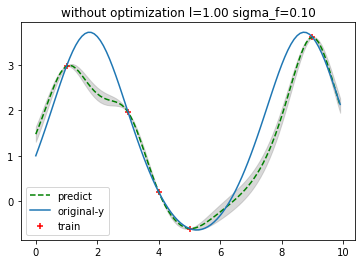

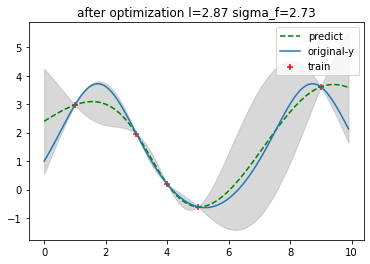

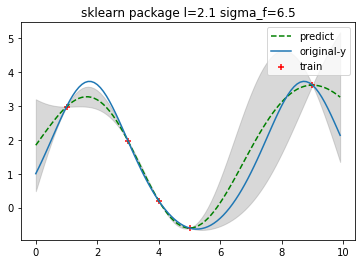

In [10]:
# experiement
train_X = np.array([3, 1, 4, 5, 9]).reshape(-1, 1)
train_y = y_1d(train_X, noise_sigma=1e-4)
test_X = np.arange(0, 10, 0.1).reshape(-1, 1)

gpr = GPR(optimize=False)
gpr.fit(train_X, train_y)
mu, cov = gpr.predict(test_X)
test_y = mu.ravel()
uncertainty = 1.96 * np.sqrt(np.diag(cov))
plt.clf()
plt.figure(1)
plt.title("without optimization l=%.2f sigma_f=%.2f" % (gpr.params["l"],gpr.params["sigma_f"]))
plt.fill_between(test_X.ravel(), test_y + uncertainty, test_y - uncertainty,color='grey', alpha=0.3)
plt.plot(test_X, test_y,'g--', label="predict")
plt.plot(test_X,y_1d(test_X,0.),'-',label="original-y")
plt.scatter(train_X, train_y, label="train", c="red", marker="+")
plt.legend()
plt.savefig('predictive distribution_without training.png')
plt.show()

# after optimize
gpr = GPR(optimize=True)
gpr.fit(train_X, train_y)
mu, cov = gpr.predict(test_X)
test_y = mu.ravel()
uncertainty = 1.96 * np.sqrt(np.diag(cov))
plt.clf()
plt.figure(1)
plt.title("after optimization l=%.2f sigma_f=%.2f" % (gpr.params["l"],gpr.params["sigma_f"]))
plt.fill_between(test_X.ravel(), test_y + uncertainty, test_y - uncertainty,color='grey', alpha=0.3)
plt.plot(test_X, test_y,'g--', label="predict")
plt.plot(test_X,y_1d(test_X,0.),'-',label="original-y")
plt.scatter(train_X, train_y, label="train", c="red", marker="+")
plt.legend()
plt.savefig('predictive distribution_without training.png')
plt.show()

# 1-D与包作对比
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import ConstantKernel, RBF

# fit GPR
kernel = ConstantKernel(constant_value=0.1, constant_value_bounds=(1e-4, 1e4)) * RBF(length_scale=1., length_scale_bounds=(1e-4, 1e4))
gpr = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=2)
gpr.fit(train_X, train_y)
mu, cov = gpr.predict(test_X, return_cov=True)
test_y = mu.ravel()
uncertainty = 1.96 * np.sqrt(np.diag(cov))

# plotting
plt.figure(2)
plt.title("sklearn package l=%.1f sigma_f=%.1f" % (gpr.kernel_.k2.length_scale, gpr.kernel_.k1.constant_value))
plt.fill_between(test_X.ravel(), test_y + uncertainty, test_y - uncertainty,color='grey', alpha=0.3)
plt.plot(test_X, test_y,'g--', label="predict")
plt.plot(test_X,y_1d(test_X,0.),'-',label="original-y")
plt.scatter(train_X, train_y, label="train", c="red", marker="+")
plt.legend()
plt.savefig('compare with GP package.png')
plt.show()



## 1维与GPy比较


Name : GP regression
Objective : 4.2229084941687285
Number of Parameters : 3
Number of Optimization Parameters : 3
Updates : True
Parameters:
  GP_regression.           |                  value  |  constraints  |  priors
  rbf.variance             |     0.7376651328366925  |      +ve      |        
  rbf.lengthscale          |     1.7866282070268447  |      +ve      |        
  Gaussian_noise.variance  |  8.622649244477512e-10  |      +ve      |        


{'dataplot': [<matplotlib.collections.PathCollection at 0x2239897ddc0>],
 'gpmean': [[<matplotlib.lines.Line2D at 0x2239897da00>]],
 'gpconfidence': [<matplotlib.collections.PolyCollection at 0x2239897dfd0>]}

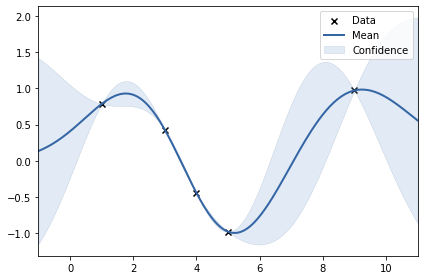

In [26]:
# compare with GPy
import GPy
import warnings
warnings.filterwarnings('ignore')
train_X = np.array([3, 1, 4, 5, 9])[:,None]
#train_X = np.linspace(0, 10, 5)[:,None]
train_y = np.array(y(train_X, noise_sigma=1e-4))
rbf = GPy.kern.RBF(1)
#rbf.lengthscalee=1
#rbf.variance=1
m=GPy.models.GPRegression(train_X,train_y,rbf,normalizer=False)
#print(m)
#m.Gaussian_noise = 1e-4
#m=GPy.examples.regression.olympic_100m_men(optimize=True,plot=True)
# 优化模型
m.optimize()
print(m)
m.plot()

## 二维仿真

C:\Users\96199\AppData\Local\Temp\ipykernel_8292\193189550.py:20: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax=plt.gca(projection='3d')
C:\Users\96199\AppData\Local\Temp\ipykernel_8292\193189550.py:29: RuntimeWarning: invalid value encountered in sqrt
  uncertainty = 1.96 * np.sqrt(np.diag(cov))
C:\Users\96199\AppData\Local\Temp\ipykernel_8292\193189550.py:33: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default 

<Figure size 432x288 with 0 Axes>

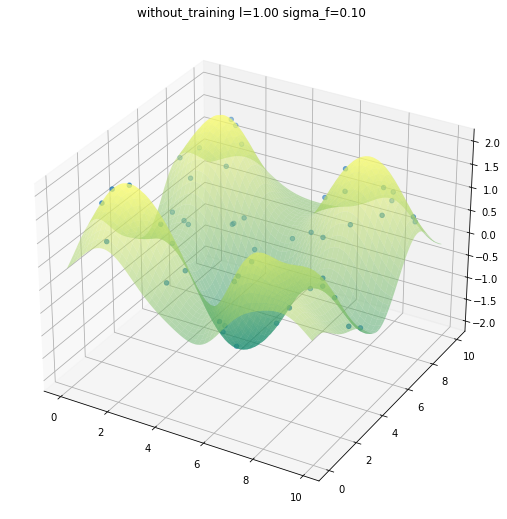

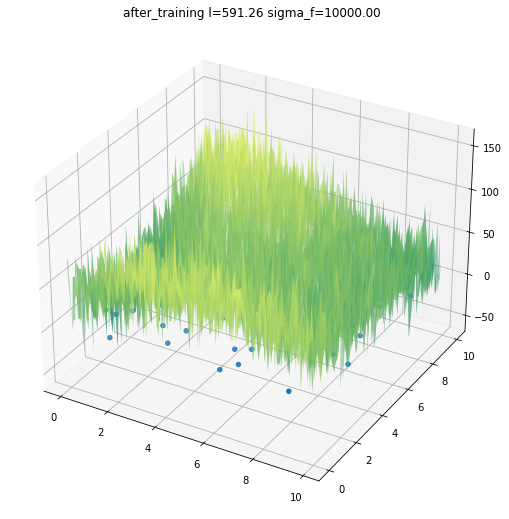

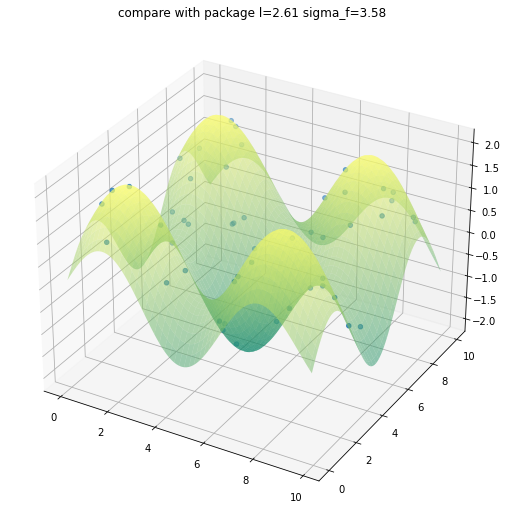

In [18]:
# experiement 2-D
#train_X = np.array([[3, 1, 4, 5, 9],[4,5,6,7,10]]).T
train_X=np.random.uniform(0,10,[50,2])
train_y = y_2d(train_X, noise_sigma=1e-4)
X_test_d1=np.arange(0, 10, 0.1).reshape(-1, 1)
X_test_d2 = np.arange(0, 10, 0.1).reshape(-1, 1)
X_test_d1, X_test_d2 = np.meshgrid(X_test_d1, X_test_d2)  # 构成网格面
test_X = [[d1, d2] for d1, d2 in zip(X_test_d1.ravel(), X_test_d2.ravel())]

gpr = GPR(optimize=False)
gpr.fit(train_X, train_y)
mu, cov = gpr.predict(test_X)
test_y = mu.ravel()
uncertainty = 1.96 * np.sqrt(np.diag(cov))
import mpl_toolkits.axisartist as axisartist
from mpl_toolkits.mplot3d import Axes3D #画三维图不可少
from matplotlib import cm  #cm 是colormap的简写
plt.clf()
fig=plt.figure(figsize=[9,9])
ax=plt.gca(projection='3d')
plt.title("without_training l=%.2f sigma_f=%.2f" % (gpr.params["l"], gpr.params["sigma_f"]))
ax.plot_surface(X_test_d1,X_test_d2,mu.reshape(X_test_d1.shape),cmap='summer',alpha=0.5)
ax.scatter(train_X[:,0],train_X[:,1],train_y)

gpr = GPR(optimize=True)
gpr.fit(train_X, train_y)
mu, cov = gpr.predict(test_X)
test_y = mu.ravel()
uncertainty = 1.96 * np.sqrt(np.diag(cov))

#plt.clf()
fig=plt.figure(figsize=[9,9])
ax=plt.gca(projection='3d')
plt.title("after_training l=%.2f sigma_f=%.2f" % (gpr.params["l"], gpr.params["sigma_f"]))
ax.plot_surface(X_test_d1,X_test_d2,mu.reshape(X_test_d1.shape),cmap='summer',alpha=0.5)
ax.scatter(train_X[:,0],train_X[:,1],train_y)


# 2-D与包作对比
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import ConstantKernel, RBF

# fit GPR
kernel = ConstantKernel(constant_value=0.1, constant_value_bounds=(1e-4, 1e4)) * RBF(length_scale=1., length_scale_bounds=(1e-4, 1e4))
gpr = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=2)
gpr.fit(train_X, train_y)
mu, cov = gpr.predict(test_X, return_cov=True)
test_y = mu.ravel()
uncertainty = 1.96 * np.sqrt(np.diag(cov))

# plotting
fig=plt.figure(figsize=[9,9])
ax=plt.gca(projection='3d')
plt.title("compare with package l=%.2f sigma_f=%.2f" % (gpr.kernel_.k2.length_scale, gpr.kernel_.k1.constant_value))
ax.plot_surface(X_test_d1,X_test_d2,mu.reshape(X_test_d1.shape),cmap='summer',alpha=0.5)
ax.scatter(train_X[:,0],train_X[:,1],train_y)


## 二维与GPy比较

In [62]:
# 2-D与包作对比
import GPy
import warnings
warnings.filterwarnings('ignore')
train_y =np.array(train_y).reshape(-1,1)
rbf=GPy.kern.RBF(2)
m=GPy.models.SparseGPRegression(train_X,train_y,kernel=rbf,num_inducing=50)
print(m)
m.optimize()
print(m)



Name : sparse_gp
Objective : 67.50435596890489
Number of Parameters : 103
Number of Optimization Parameters : 103
Updates : True
Parameters:
  sparse_gp.               |    value  |  constraints  |  priors
  inducing_inputs          |  (50, 2)  |               |        
  rbf.variance             |      1.0  |      +ve      |        
  rbf.lengthscale          |      1.0  |      +ve      |        
  Gaussian_noise.variance  |      1.0  |      +ve      |        

Name : sparse_gp
Objective : -35.399456426501274
Number of Parameters : 103
Number of Optimization Parameters : 103
Updates : True
Parameters:
  sparse_gp.               |                  value  |  constraints  |  priors
  inducing_inputs          |                (50, 2)  |               |        
  rbf.variance             |      7.640826169436312  |      +ve      |        
  rbf.lengthscale          |     2.9649093022442736  |      +ve      |        
  Gaussian_noise.variance  |  3.699938172364235e-07  |      +ve      |   

## 1维的BO实验

In [63]:
# 1-D plot
import matplotlib.pyplot as plt
import numpy as np
def plot_1d(train_X,train_y,test_X,test_y,uncertainty,gen):
    plt.figure(figsize=[19,6])
    plt.subplot(121)
    plt.title("after %d step l=%.2f sigma_f=%.2f" % (gen,gpr.params["l"], gpr.params["sigma_f"]))
    plt.fill_between(test_X.ravel(), test_y + uncertainty, test_y - uncertainty,color='grey', alpha=0.3)
    plt.plot(test_X, test_y,'g--', label="predict",linewidth=4)
    plt.plot(test_X,y_1d(test_X,0.),'-',linewidth=4,label="original-y")
    plt.scatter(train_X, train_y, label="train", c="red", marker="+",s=400)
    plt.xlim(0,8)
    plt.legend()
    
    #draw UCB
    mean=np.array(test_y)
    UCB=mean+1.96*uncertainty
    index=np.argmax(UCB)
    plt.subplot(122)
    plt.title("UCB")
    plt.plot(test_X,mean+1.96*uncertainty,label='utility function',linewidth=4)
    plt.scatter(test_X[index],UCB[index],marker='*',c='red',s=200,label='next best guess')
    plt.legend()
    plt.xlim(0,8)
    plt.show()
    
    return test_X[index]

After 1 step, we have GPR as follows:


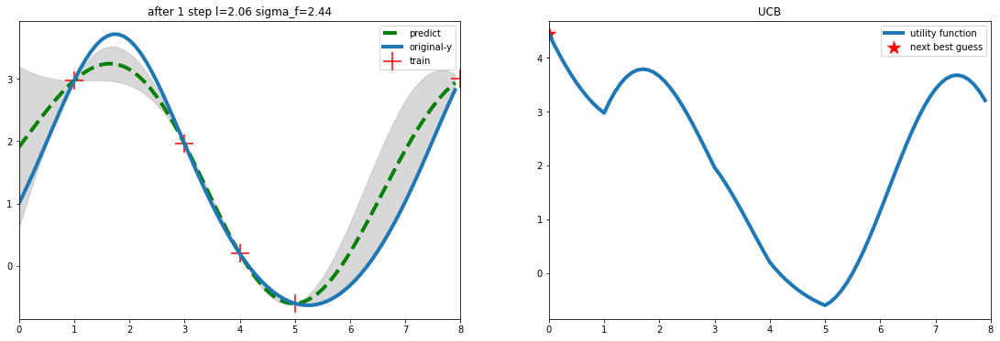

The next best guess is at x=0.00
After 2 step, we have GPR as follows:


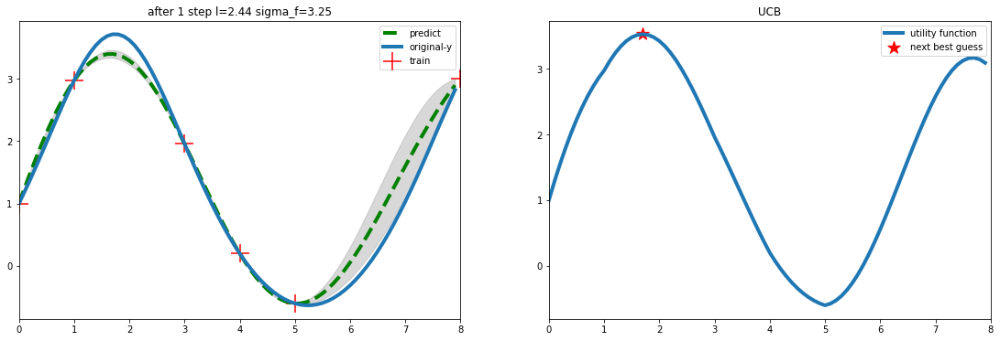

The next best guess is at x=1.70
After 3 step, we have GPR as follows:


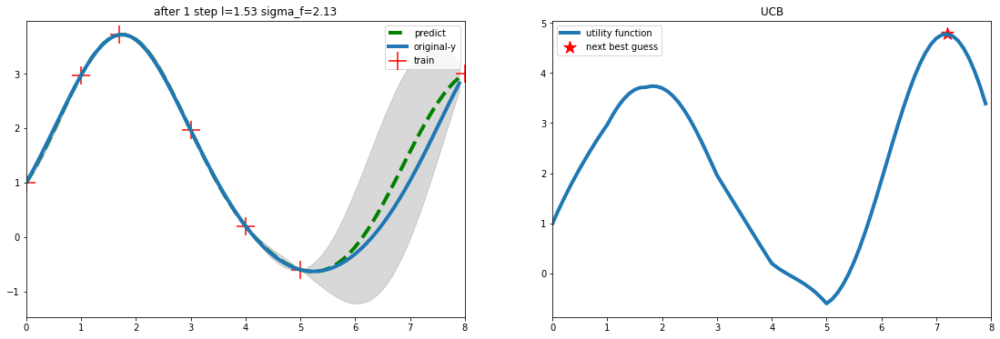

The next best guess is at x=7.20
After 4 step, we have GPR as follows:


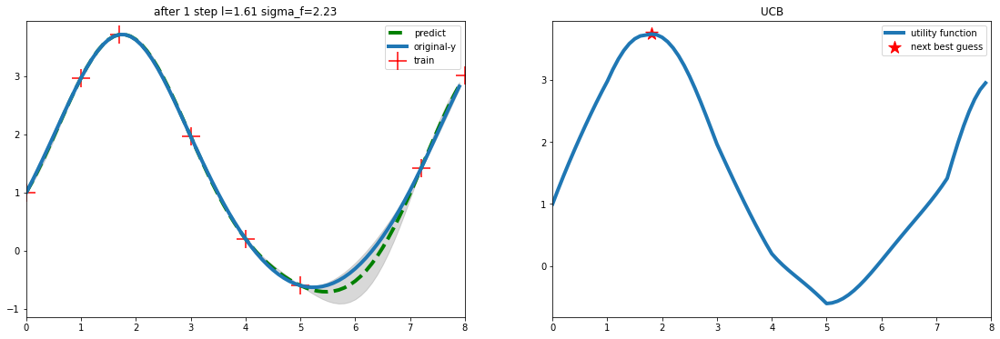

The next best guess is at x=1.80
After 5 step, we have GPR as follows:


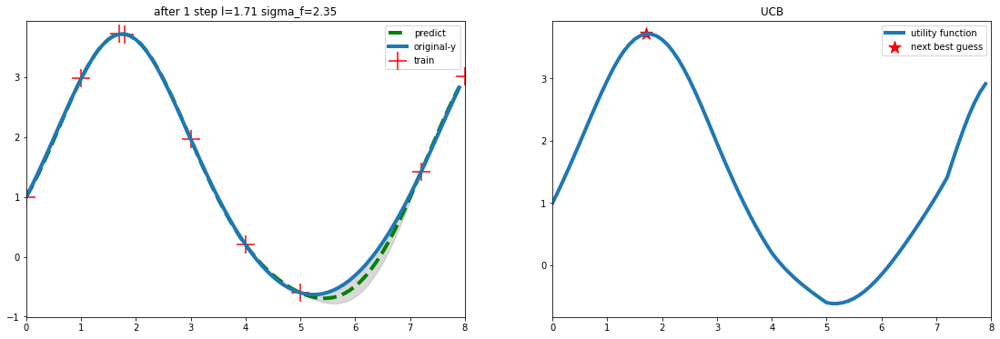

The next best guess is at x=1.70


In [65]:
# experiement
# initialize
train_X = np.array([3, 1, 4, 5,8]).reshape(-1, 1)
train_y = y_1d(train_X, noise_sigma=1e-4)
test_X = np.arange(0, 8, 0.1).reshape(-1, 1)

gen=5
for i in range(gen):
    print("After %d step, we have GPR as follows:" %(i+1))
    gpr = GPR(optimize=True)
    gpr.fit(train_X, train_y)
    mu, cov = gpr.predict(test_X)
    test_y = mu.ravel()
    uncertainty = 1.96 * np.sqrt(np.diag(cov))
    new=plot_1d(train_X,train_y,test_X,test_y,uncertainty,1)
    print("The next best guess is at x=%.2f"%new)
    train_X=np.append(train_X,new).reshape(-1,1)
    train_y = y_1d(train_X, noise_sigma=1e-4)

## 2维的BO实验

In [130]:
def plot_2d(X_test_d1,X_test_d2,mu,uncertainty,train_X,train_y,gen):
    fig=plt.figure(figsize=[9,9])
    ax=plt.gca(projection='3d')
    plt.title("GPR after %d step"%(gen))
    ax.plot_surface(X_test_d1,X_test_d2,mu.reshape(X_test_d1.shape),cmap='summer',alpha=0.5)
    ax.scatter(train_X[:,0],train_X[:,1],train_y)
    ax.contourf(X_test_d1,X_test_d2,mu.reshape(X_test_d1.shape),zdir='z',offset=-2,cmap='summer',alpha=0.5)
    ax.set(xlim=[0,10],ylim=[0,10])
    plt.savefig('2_d BO_GP.png')
    
    fig=plt.figure(figsize=[9,9])
    ax=plt.gca(projection='3d')
    plt.title("UBC")
    ax.plot_surface(X_test_d1,X_test_d2,(mu+uncertainty).reshape(X_test_d1.shape),cmap='coolwarm')
    
    plt.savefig('2_d BO_UBC.png')

In [131]:
def renew_2d(X_test_d1,mu,uncertainty):
    UCB=(mu+uncertainty).reshape(X_test_d1.shape)
    index=np.argmax(UCB)
    return index//100,index%100

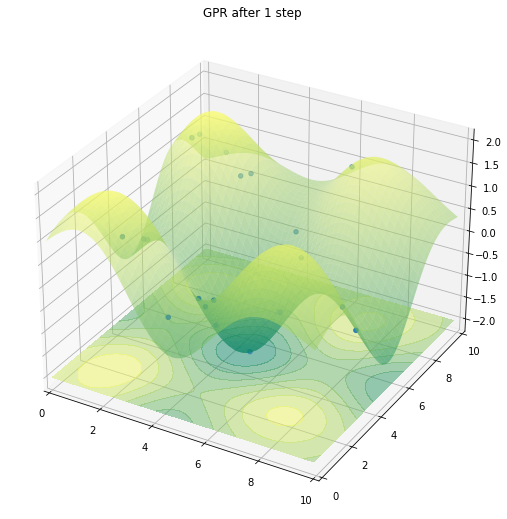

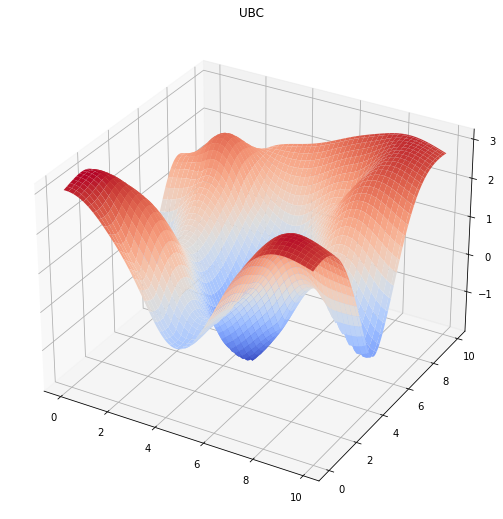

In [139]:
# experiement 2-D
#train_X = np.array([[3, 1, 4, 5, 9],[4,5,6,7,10]]).T
train_X=np.random.uniform(0,10,[20,2])
train_y = y_2d(train_X, noise_sigma=1e-4)
X_test_d1=np.arange(0, 10, 0.1).reshape(-1, 1)
X_test_d2 = np.arange(0, 10, 0.1).reshape(-1, 1)
X_test_d1, X_test_d2 = np.meshgrid(X_test_d1, X_test_d2)  # 构成网格面
test_X = [[d1, d2] for d1, d2 in zip(X_test_d1.ravel(), X_test_d2.ravel())]

gpr = GPR(optimize=True)
gpr.fit(train_X, train_y)
mu, cov = gpr.predict(test_X)
test_y = mu.ravel()
uncertainty = 1.96 * np.sqrt(np.diag(cov))
UCB=mu+uncertainty
plot_2d(X_test_d1,X_test_d2,mu,uncertainty,train_X,train_y,1)

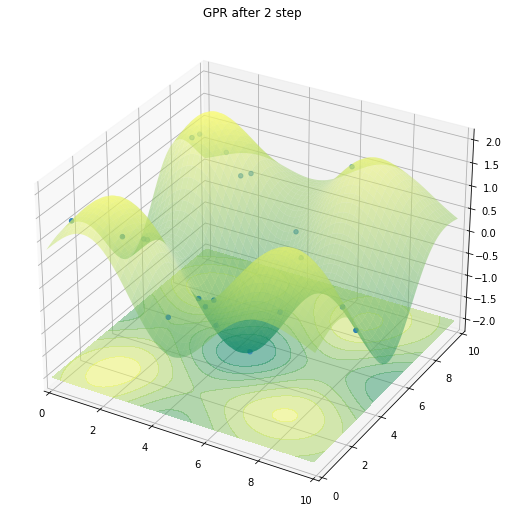

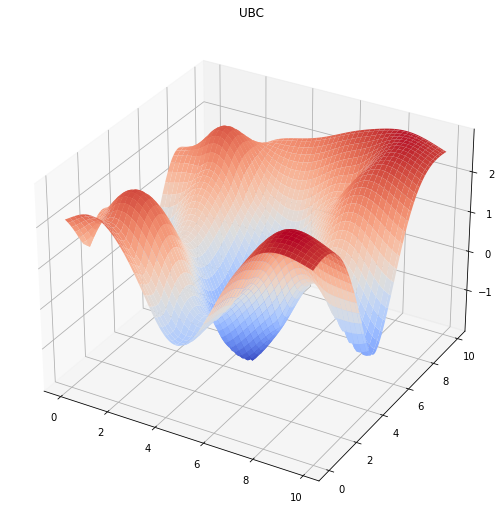

In [140]:
# the second step
index=renew_2d(X_test_d1,mu,uncertainty)
train_X=np.append(train_X,np.array([X_test_d1[index],X_test_d2[index]])).reshape(-1,2)
train_y = y_2d(train_X, noise_sigma=1e-4)
gpr = GPR(optimize=True)
gpr.fit(train_X, train_y)
mu, cov = gpr.predict(test_X)
test_y = mu.ravel()
uncertainty = 1.96 * np.sqrt(np.diag(cov))
UCB=mu+uncertainty
plot_2d(X_test_d1,X_test_d2,mu,uncertainty,train_X,train_y,2)

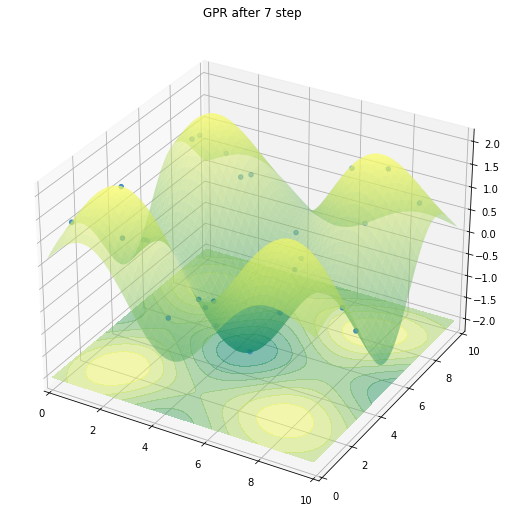

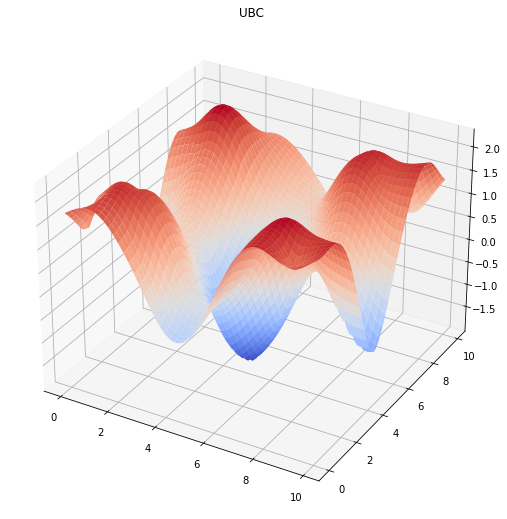

In [141]:
# 再做5步
for i in range(5):
    index=renew_2d(X_test_d1,mu,uncertainty)
    train_X=np.append(train_X,np.array([X_test_d1[index],X_test_d2[index]])).reshape(-1,2)
    train_y = y_2d(train_X, noise_sigma=1e-4)
    gpr = GPR(optimize=True)
    gpr.fit(train_X, train_y)
    mu, cov = gpr.predict(test_X)
    test_y = mu.ravel()
    uncertainty = 1.96 * np.sqrt(np.diag(cov))
    
    
plot_2d(X_test_d1,X_test_d2,mu,uncertainty,train_X,train_y,7)

## 定义multi-local-optima函数

### Bukin function

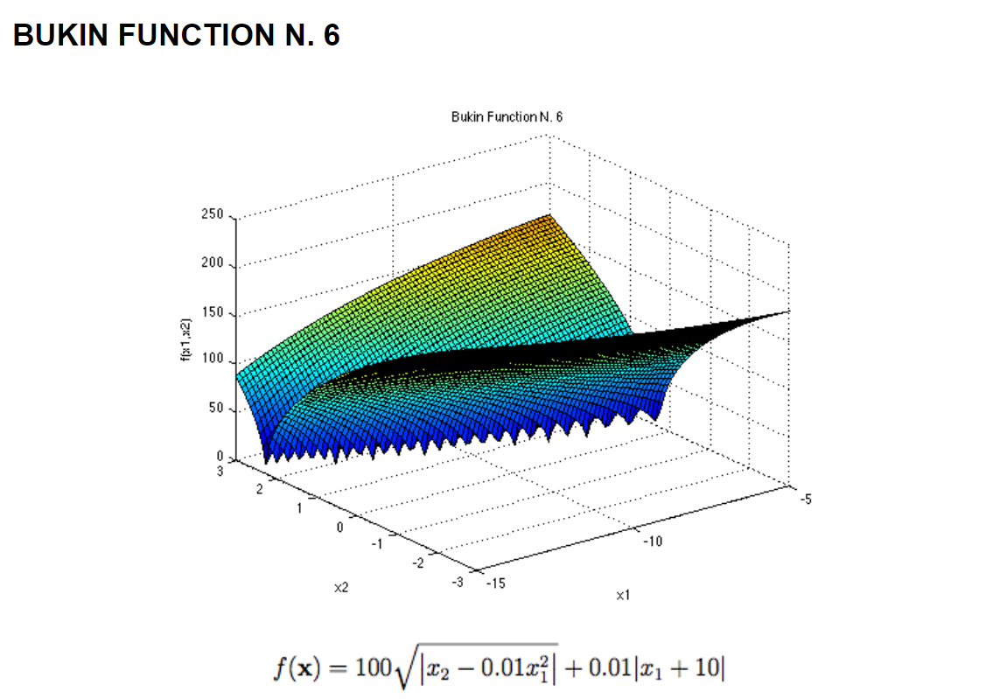

In [22]:
# define Buckin function: many local optima
# x1 ∈ [-15, -5], x2 ∈ [-3, 3]
# local minimum 0 at (10,1)
def Buckin_funcion(x1,x2,sigma_n=0.0):
    y=100*np.sqrt(abs(x2-0.01*x1**2))+0.01*abs(x1+10)
    y += np.random.normal(0, sigma_n, size=y.shape)
    return y

In [30]:
def plot_2d(X_test_d1,X_test_d2,mu,uncertainty,train_X,train_y,gen):
    fig=plt.figure(figsize=[9,9])
    ax=plt.gca(projection='3d')
    plt.title("GPR after %d step"%(gen))
    ax.plot_surface(X_test_d1,X_test_d2,mu.reshape(X_test_d1.shape),cmap='summer',alpha=0.5)
    ax.scatter(train_X[:,0],train_X[:,1],train_y)
    #ax.set(xlim=[-15,5],ylim=[-3,3])
    ax.set_xlabel("X1")
    ax.set_ylabel("X2")
    ax.set_zlabel("output")
    
    fig=plt.figure(figsize=[9,9])
    ax=plt.gca(projection='3d')
    plt.title("UBC")
    ax.plot_surface(X_test_d1,X_test_d2,(mu+uncertainty).reshape(X_test_d1.shape),cmap='coolwarm')

In [24]:
def renew_2d(X_test_d1,mu,uncertainty):
    UCB=(mu-uncertainty).reshape(X_test_d1.shape)
    index=np.argmax(-UCB)
    return index//100,index%100

In [25]:
global noise
noise=1e-4

In [31]:
def initialize():
    n=100        #number of samples 
    train_X1=np.random.uniform(-15,-5,[n,1])
    train_X2=np.random.uniform(-3,3,[n,1])
    train_X=np.hstack((train_X1,train_X2))
    train_y = Buckin_funcion(train_X1,train_X2,noise)
    return train_X1,train_X2,train_X,train_y

C:\Users\96199\AppData\Local\Temp\ipykernel_20088\127483564.py:56: RuntimeWarning: invalid value encountered in sqrt
  k_52=(1+np.sqrt(5*dist_matrix)/self.params["l"]+5*dist_matrix/3/self.params["l"]**2)*np.exp(-np.sqrt(5*dist_matrix)/self.params["l"])
C:\Users\96199\AppData\Local\Temp\ipykernel_20088\2022663487.py:3: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax=plt.gca(projection='3d')
C:\Users\96199\AppData\Local\Temp\ipykernel_20088\2022663487.py:13: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function 

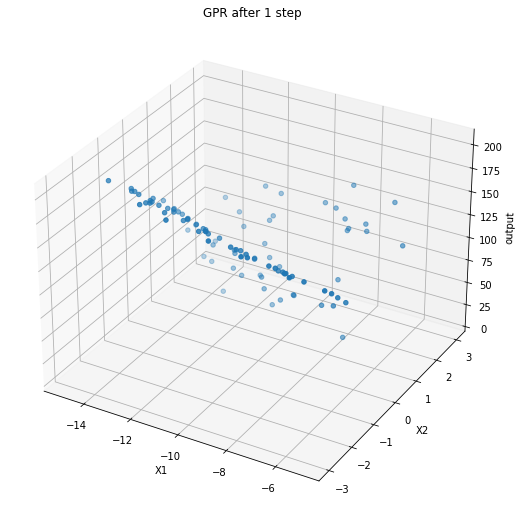

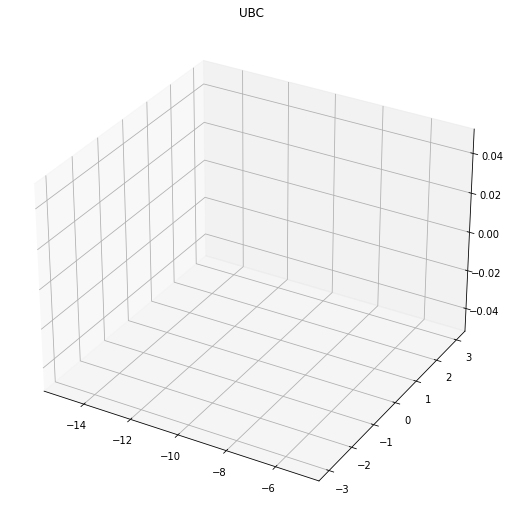

In [29]:
# experiement Buckin function
#train_X = np.array([[3, 1, 4, 5, 9],[4,5,6,7,10]]).T
train_X1,train_X2,train_X,train_y=initialize()
copy_X1,copy_X2=train_X1,train_X2
X_test_d1=np.linspace(-15,-5, 100).reshape(-1, 1)
X_test_d2 = np.linspace(-3, 3, 100).reshape(-1, 1)
X_test_d1, X_test_d2 = np.meshgrid(X_test_d1, X_test_d2)  # 构成网格面
test_X = [[d1, d2] for d1, d2 in zip(X_test_d1.ravel(), X_test_d2.ravel())]

gpr = GPR(optimize=True)
gpr.fit(train_X, train_y)
mu, cov = gpr.predict(test_X)
test_y = mu.ravel()
uncertainty = 1.96 * np.sqrt(np.diag(cov))
plot_2d(X_test_d1,X_test_d2,test_y,uncertainty,train_X,train_y,1)

In [28]:
# 再做100步
gen=100
for i in range(gen):
    index=renew_2d(X_test_d1,test_y,uncertainty)
    train_X=np.append(train_X,np.array([X_test_d1[index],X_test_d2[index]])).reshape(-1,2)
    new_y=Buckin_funcion(X_test_d1[index],X_test_d2[index],noise)
    train_y = np.append(train_y,new_y).reshape(-1,1)
    gpr = GPR(optimize=True)
    gpr.fit(train_X, train_y)
    mu, cov = gpr.predict(test_X)
    test_y = mu.ravel()
    uncertainty = 1.96 * np.sqrt(np.diag(cov)) 
    if Buckin_funcion(X_test_d1[index],X_test_d2[index])<10 :
        print("After %d iterations"%(i+2))
        break
    
plot_2d(X_test_d1,X_test_d2,test_y,uncertainty,train_X,train_y,i+2)
print("fmin=f(%.2f,%.2f)=%.2f"
      %(X_test_d1[index],X_test_d2[index],Buckin_funcion(X_test_d1[index],X_test_d2[index],noise)))

C:\Users\96199\AppData\Local\Temp\ipykernel_20088\127483564.py:56: RuntimeWarning: invalid value encountered in sqrt
  k_52=(1+np.sqrt(5*dist_matrix)/self.params["l"]+5*dist_matrix/3/self.params["l"]**2)*np.exp(-np.sqrt(5*dist_matrix)/self.params["l"])


KeyboardInterrupt: 

compare with package

C:\Users\96199\AppData\Local\Temp\ipykernel_22288\2022663487.py:3: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax=plt.gca(projection='3d')
C:\Users\96199\AppData\Local\Temp\ipykernel_22288\2022663487.py:13: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax=plt.gca(projection='3d')


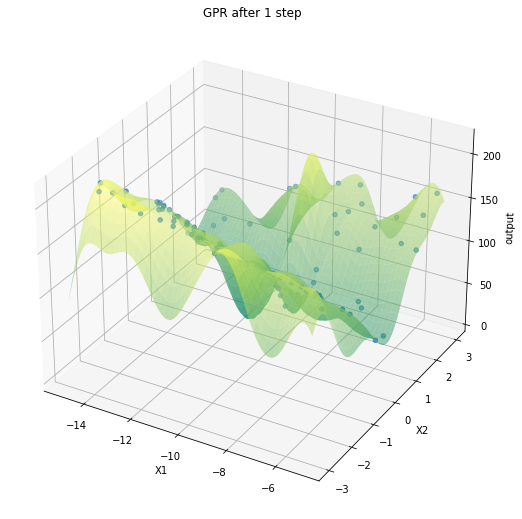

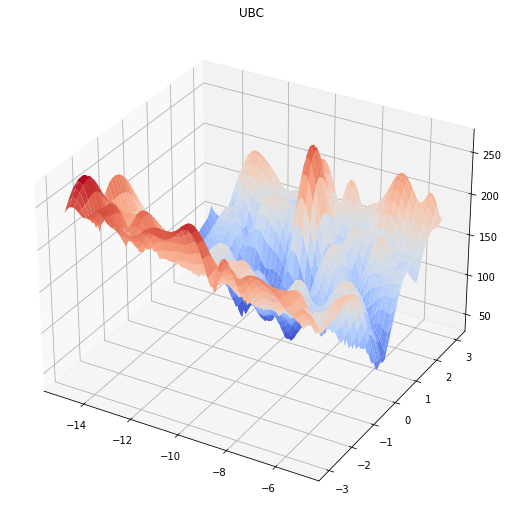

In [10]:
# experiement Buckin function
#train_X = np.array([[3, 1, 4, 5, 9],[4,5,6,7,10]]).T
train_X1=copy_X1
train_X2=copy_X2
train_X=np.hstack((train_X1,train_X2))
train_y =Buckin_funcion(train_X1,train_X2,noise)
X_test_d1=np.linspace(-15,-5, 100).reshape(-1, 1)
X_test_d2 = np.linspace(-3, 3, 100).reshape(-1, 1)
X_test_d1, X_test_d2 = np.meshgrid(X_test_d1, X_test_d2)  # 构成网格面
test_X = [[d1, d2] for d1, d2 in zip(X_test_d1.ravel(), X_test_d2.ravel())]

# 2-D与包作对比
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import ConstantKernel, RBF

# fit GPR
kernel = ConstantKernel(constant_value=0.1, constant_value_bounds=(1e-4, 1e4)) * RBF(length_scale=1., length_scale_bounds=(1e-4, 1e4))
gpr = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=2)
gpr.fit(train_X, train_y)
mu, cov = gpr.predict(test_X, return_cov=True)
test_y = mu.ravel()
uncertainty = 1.96 * np.sqrt(np.diag(cov))

plot_2d(X_test_d1,X_test_d2,test_y,uncertainty,train_X,train_y,1)


C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified lower bound 0.0001. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:420: ConvergenceWarning: The optimal value found for

C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\gaussian_process\_gpr.py:610: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
C:\Python39\lib\site-packages\sklearn\gaussian_process\_gpr.py:610: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
C:\Python39\lib\site-pack

C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified lower bound 0.0001. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\gaussian_process\_gpr.py:610: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:430: Co

C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified lower bound 0.0001. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:420: ConvergenceWarning: The optimal value found for

C:\Python39\lib\site-packages\sklearn\gaussian_process\_gpr.py:610: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified lower bound 0.0001. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:430: Co

C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified lower bound 0.0001. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:420: ConvergenceWarning: The optimal value found for

C:\Python39\lib\site-packages\sklearn\gaussian_process\_gpr.py:610: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified lower bound 0.0001. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:430: Co

C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:420: ConvergenceWarning: The optimal value found 

C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified lower bound 0.0001. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\gaussian_process\_gpr.py:610: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:430: Co

C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified lower bound 0.0001. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for

C:\Python39\lib\site-packages\sklearn\gaussian_process\_gpr.py:610: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:420:

C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified lower bound 0.0001. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:420: ConvergenceWarning: The optimal value found for

C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified lower bound 0.0001. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\gaussian_process\kernels.py:420: ConvergenceWarning: The optimal value found for

fmin=f(-10.66,-2.94)=201.87


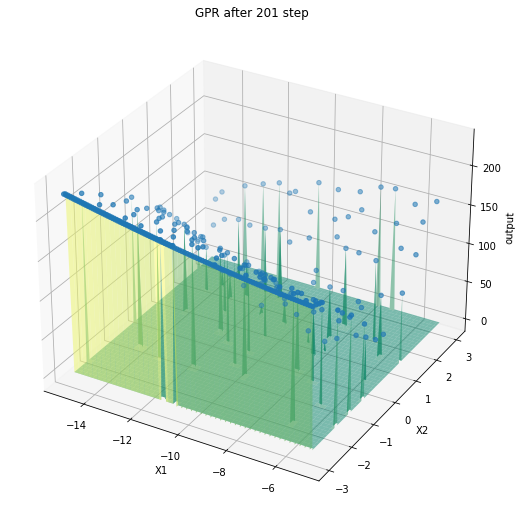

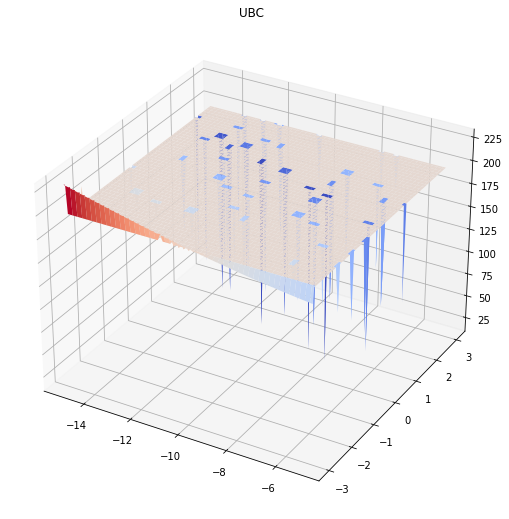

In [11]:
# 再做100步
gen=200
for i in range(gen):
    index=renew_2d(X_test_d1,test_y,uncertainty)
    train_X=np.append(train_X,np.array([X_test_d1[index],X_test_d2[index]])).reshape(-1,2)
    new_y=Buckin_funcion(X_test_d1[index],X_test_d2[index],noise)
    train_y = np.append(train_y,new_y).reshape(-1,1)
    gpr.fit(train_X, train_y)
    mu, cov = gpr.predict(test_X, return_cov=True)
    test_y = mu.ravel()
    uncertainty = 1.96 * np.sqrt(np.diag(cov))
    if Buckin_funcion(X_test_d1[index],X_test_d2[index])<1 :
        print("After %d iterations"%(i+2))
        break
    
plot_2d(X_test_d1,X_test_d2,test_y,uncertainty,train_X,train_y,i+2)
print("fmin=f(%.2f,%.2f)=%.2f"
      %(X_test_d1[index],X_test_d2[index],Buckin_funcion(X_test_d1[index],X_test_d2[index],noise)))

### Schwefel function

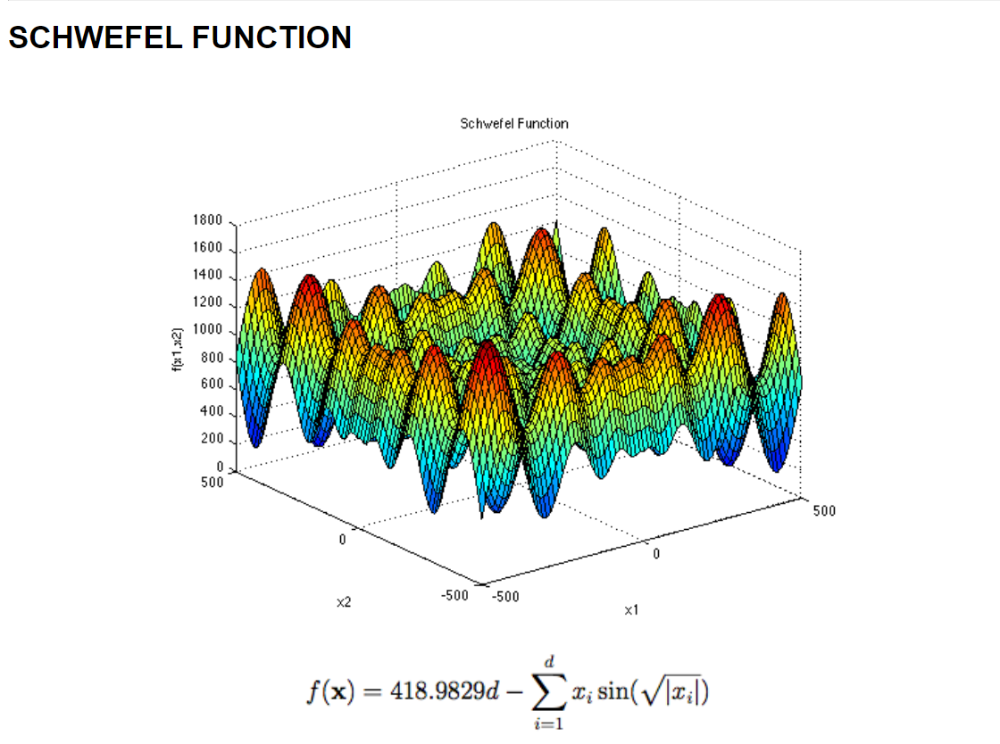

In [290]:
# define schwefel function
# x_i in [-500,500]
def Schwefel_function(x1,x2,sigma_n=0.0):
    y=418.9829*d-x1*np.sin(np.sqrt(abs(x1)))-x2*np.sin(np.sqrt(abs(x2)))
    y += np.random.normal(0, sigma_n, size=y.shape)
    return y

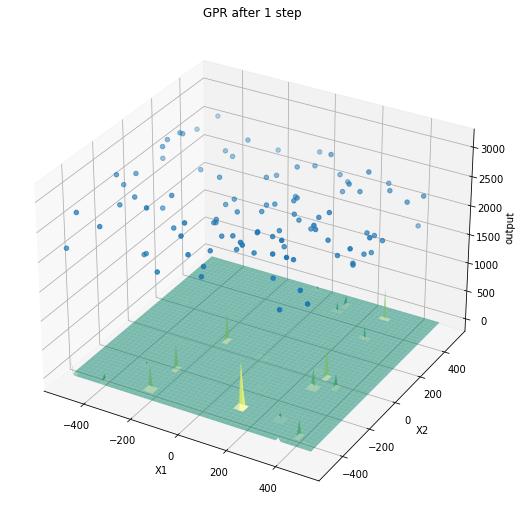

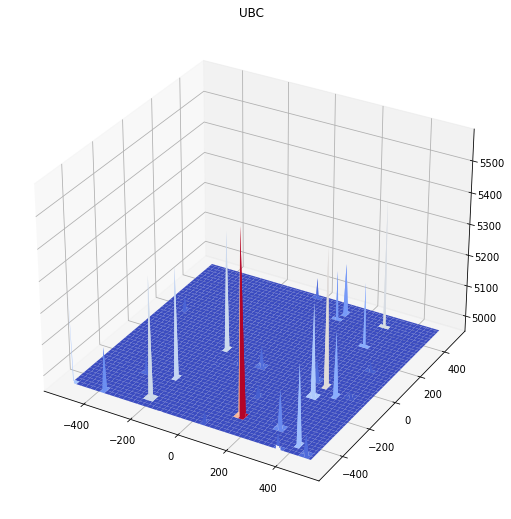

In [299]:
# experiement Buckin function
#train_X = np.array([[3, 1, 4, 5, 9],[4,5,6,7,10]]).T
train_X1=np.random.uniform(-500,500,[100,1])
train_X2=np.random.uniform(-500,500,[100,1])
train_X=np.hstack((train_X1,train_X2))
train_y =Schwefel_function(train_X1,train_X2)
X_test_d1=np.linspace(-500,500, 100).reshape(-1, 1)
X_test_d2 = np.linspace(-500, 500, 100).reshape(-1, 1)
X_test_d1, X_test_d2 = np.meshgrid(X_test_d1, X_test_d2)  # 构成网格面
test_X = [[d1, d2] for d1, d2 in zip(X_test_d1.ravel(), X_test_d2.ravel())]

gpr = GPR(optimize=True)
gpr.fit(train_X, train_y)
mu, cov = gpr.predict(test_X)
test_y = mu.ravel()
uncertainty = 1.96 * np.sqrt(np.diag(cov))
UCB=mu+uncertainty
plot_2d(X_test_d1,X_test_d2,test_y,uncertainty,train_X,train_y,1)

### Cross-in-tray function

In [2]:
def cross_function(x1,x2,sigma_n=0.0):
    temp=np.exp(abs(100-np.sqrt(x1**2+x2**2)/np.pi))
    y=-0.0001*(abs(np.sin(x1)*np.sin(x2)*temp)+1)**0.1
    y+=np.random.normal(0, sigma_n, size=y.shape)
    return y

In [15]:
def initialize():
    n=1000        #number of samples 
    train_X1=np.random.uniform(-2,2,[n,1])
    train_X2=np.random.uniform(-2,2,[n,1])
    train_X=np.hstack((train_X1,train_X2))
    train_y = cross_function(train_X1,train_X2,noise)
    return train_X1,train_X2,train_X,train_y

C:\Users\96199\AppData\Local\Temp\ipykernel_18588\2022663487.py:3: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax=plt.gca(projection='3d')
C:\Users\96199\AppData\Local\Temp\ipykernel_18588\2022663487.py:13: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax=plt.gca(projection='3d')


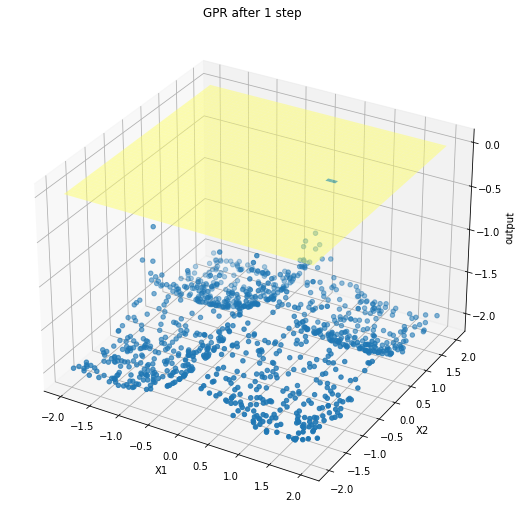

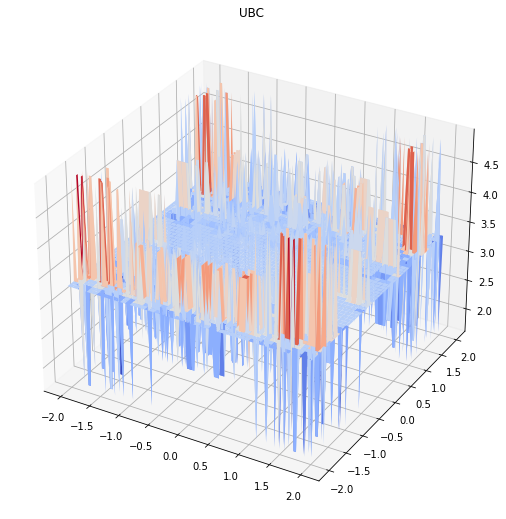

In [16]:
# experiement Buckin function
#train_X = np.array([[3, 1, 4, 5, 9],[4,5,6,7,10]]).T
train_X1,train_X2,train_X,train_y=initialize()
copy_X1,copy_X2=train_X1,train_X2
X_test_d1=np.linspace(-2,2, 100).reshape(-1, 1)
X_test_d2 = np.linspace(-2, 2, 100).reshape(-1, 1)
X_test_d1, X_test_d2 = np.meshgrid(X_test_d1, X_test_d2)  # 构成网格面
test_X = [[d1, d2] for d1, d2 in zip(X_test_d1.ravel(), X_test_d2.ravel())]

gpr = GPR(optimize=True)
gpr.fit(train_X, train_y)
mu, cov = gpr.predict(test_X)
test_y = mu.ravel()
uncertainty = 1.96 * np.sqrt(np.diag(cov))
plot_2d(X_test_d1,X_test_d2,test_y,uncertainty,train_X,train_y,1)

C:\Users\96199\AppData\Local\Temp\ipykernel_18588\796218603.py:12: RuntimeWarning: invalid value encountered in sqrt
  uncertainty = 1.96 * np.sqrt(np.diag(cov))


After 3 iterations


C:\Users\96199\AppData\Local\Temp\ipykernel_18588\2022663487.py:3: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax=plt.gca(projection='3d')
C:\Users\96199\AppData\Local\Temp\ipykernel_18588\2022663487.py:13: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax=plt.gca(projection='3d')


fmin=f(0.99,-0.95)=-2.03


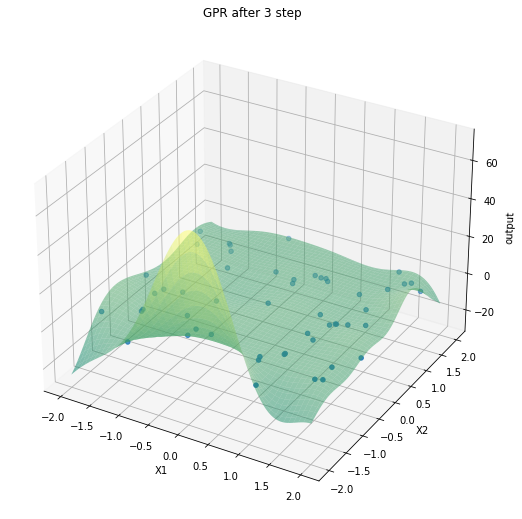

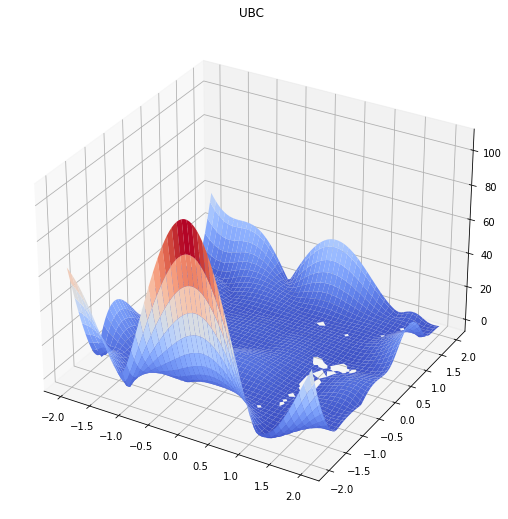

In [14]:
# 再做100步
gen=100
for i in range(gen):
    index=renew_2d(X_test_d1,test_y,uncertainty)
    train_X=np.append(train_X,np.array([X_test_d1[index],X_test_d2[index]])).reshape(-1,2)
    new_y=cross_function(X_test_d1[index],X_test_d2[index],noise)
    train_y = np.append(train_y,new_y).reshape(-1,1)
    gpr = GPR(optimize=True)
    gpr.fit(train_X, train_y)
    mu, cov = gpr.predict(test_X)
    test_y = mu.ravel()
    uncertainty = 1.96 * np.sqrt(np.diag(cov)) 
    if cross_function(X_test_d1[index],X_test_d2[index])<-2 :
        print("After %d iterations"%(i+2))
        break
    
plot_2d(X_test_d1,X_test_d2,test_y,uncertainty,train_X,train_y,i+2)
print("fmin=f(%.2f,%.2f)=%.2f"
      %(X_test_d1[index],X_test_d2[index],cross_function(X_test_d1[index],X_test_d2[index],noise)))

### Schaffer function

In [17]:
def Schaffer_function(x1,x2,sigma_n):
    temp1=(np.sin(x1**2-x2**2))**2-0.5
    temp2=(1+0.001*(x1**2+x2**2))**2
    y=0.5+temp1/temp2
    y+=np.random.normal(0, sigma_n, size=y.shape)
    return y

In [22]:
def initialize():
    n=100       #number of samples 
    train_X1=np.random.uniform(-2,2,[n,1])
    train_X2=np.random.uniform(-2,2,[n,1])
    train_X=np.hstack((train_X1,train_X2))
    train_y = Schaffer_function(train_X1,train_X2,noise)
    return train_X1,train_X2,train_X,train_y

C:\Users\96199\AppData\Local\Temp\ipykernel_18588\4032148204.py:14: RuntimeWarning: invalid value encountered in sqrt
  uncertainty = 1.96 * np.sqrt(np.diag(cov))
C:\Users\96199\AppData\Local\Temp\ipykernel_18588\2022663487.py:3: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax=plt.gca(projection='3d')
C:\Users\96199\AppData\Local\Temp\ipykernel_18588\2022663487.py:13: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with def

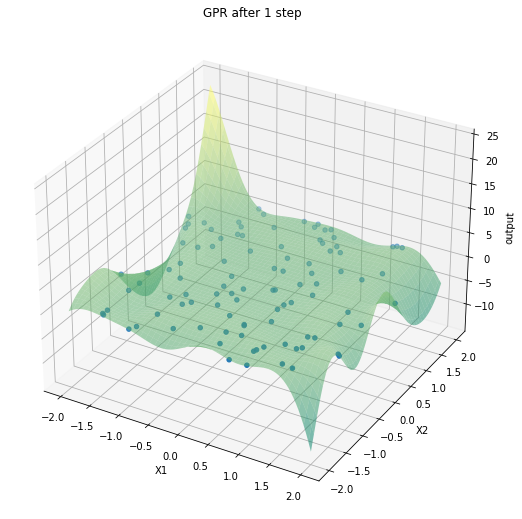

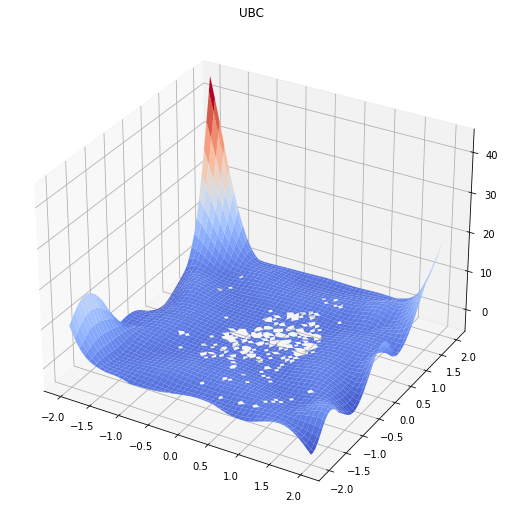

In [23]:
# experiement Buckin function
#train_X = np.array([[3, 1, 4, 5, 9],[4,5,6,7,10]]).T
train_X1,train_X2,train_X,train_y=initialize()
copy_X1,copy_X2=train_X1,train_X2
X_test_d1=np.linspace(-2,2, 100).reshape(-1, 1)
X_test_d2 = np.linspace(-2, 2, 100).reshape(-1, 1)
X_test_d1, X_test_d2 = np.meshgrid(X_test_d1, X_test_d2)  # 构成网格面
test_X = [[d1, d2] for d1, d2 in zip(X_test_d1.ravel(), X_test_d2.ravel())]

gpr = GPR(optimize=True)
gpr.fit(train_X, train_y)
mu, cov = gpr.predict(test_X)
test_y = mu.ravel()
uncertainty = 1.96 * np.sqrt(np.diag(cov))
plot_2d(X_test_d1,X_test_d2,test_y,uncertainty,train_X,train_y,1)

C:\Users\96199\AppData\Local\Temp\ipykernel_18588\761750535.py:12: RuntimeWarning: invalid value encountered in sqrt
  uncertainty = 1.96 * np.sqrt(np.diag(cov))
C:\Users\96199\AppData\Local\Temp\ipykernel_18588\2022663487.py:3: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax=plt.gca(projection='3d')
C:\Users\96199\AppData\Local\Temp\ipykernel_18588\2022663487.py:13: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with defa

After 2 iterations
fmin=f(0.71,-1.92)=0.01


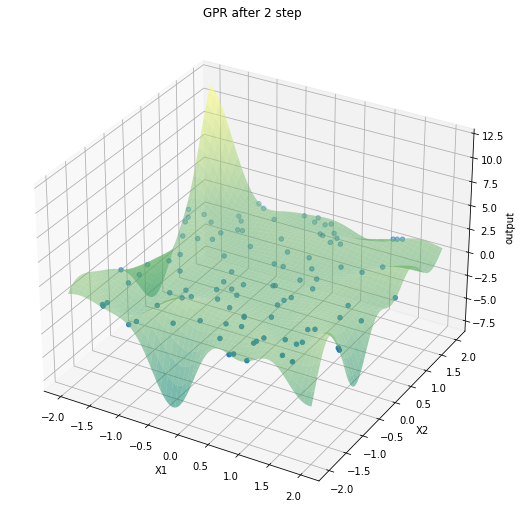

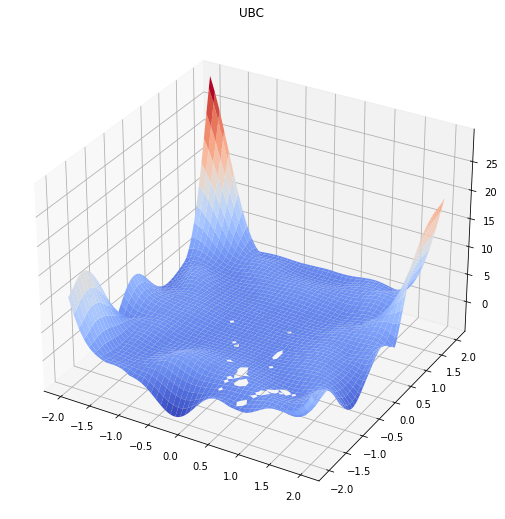

In [24]:
# 再做100步
gen=100
for i in range(gen):
    index=renew_2d(X_test_d1,test_y,uncertainty)
    train_X=np.append(train_X,np.array([X_test_d1[index],X_test_d2[index]])).reshape(-1,2)
    new_y=Schaffer_function(X_test_d1[index],X_test_d2[index],noise)
    train_y = np.append(train_y,new_y).reshape(-1,1)
    gpr = GPR(optimize=True)
    gpr.fit(train_X, train_y)
    mu, cov = gpr.predict(test_X)
    test_y = mu.ravel()
    uncertainty = 1.96 * np.sqrt(np.diag(cov)) 
    if Schaffer_function(X_test_d1[index],X_test_d2[index],noise)<0.1 :
        print("After %d iterations"%(i+2))
        break
    
plot_2d(X_test_d1,X_test_d2,test_y,uncertainty,train_X,train_y,i+2)
print("fmin=f(%.2f,%.2f)=%.2f"
      %(X_test_d1[index],X_test_d2[index],Schaffer_function(X_test_d1[index],X_test_d2[index],noise)))

C:\Users\96199\AppData\Local\Temp\ipykernel_18588\2022663487.py:3: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax=plt.gca(projection='3d')
C:\Users\96199\AppData\Local\Temp\ipykernel_18588\2022663487.py:13: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax=plt.gca(projection='3d')


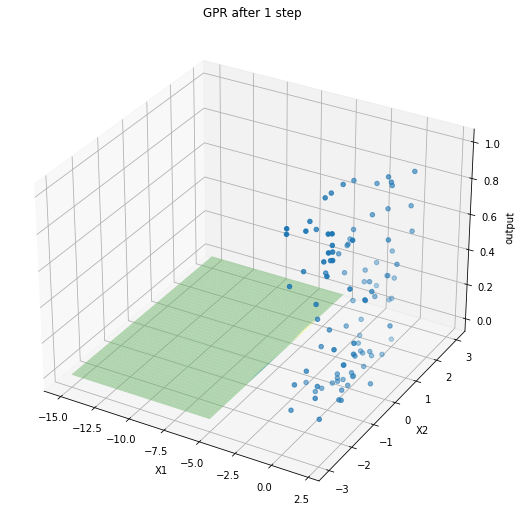

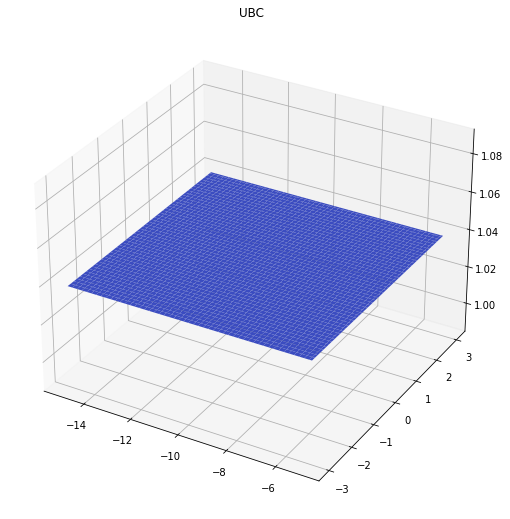

In [26]:
# experiement Buckin function
#train_X = np.array([[3, 1, 4, 5, 9],[4,5,6,7,10]]).T
train_X1=copy_X1
train_X2=copy_X2
train_X=np.hstack((train_X1,train_X2))
train_y =Schaffer_function(train_X1,train_X2,noise)
X_test_d1=np.linspace(-15,-5, 100).reshape(-1, 1)
X_test_d2 = np.linspace(-3, 3, 100).reshape(-1, 1)
X_test_d1, X_test_d2 = np.meshgrid(X_test_d1, X_test_d2)  # 构成网格面
test_X = [[d1, d2] for d1, d2 in zip(X_test_d1.ravel(), X_test_d2.ravel())]

# 2-D与包作对比
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import ConstantKernel, RBF

# fit GPR
kernel = ConstantKernel(constant_value=0.1, constant_value_bounds=(1e-4, 1e4)) * RBF(length_scale=1., length_scale_bounds=(1e-4, 1e4))
gpr = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=2)
gpr.fit(train_X, train_y)
mu, cov = gpr.predict(test_X, return_cov=True)
test_y = mu.ravel()
uncertainty = 1.96 * np.sqrt(np.diag(cov))

plot_2d(X_test_d1,X_test_d2,test_y,uncertainty,train_X,train_y,1)


## 定义bowl-shaped function

### sphere function

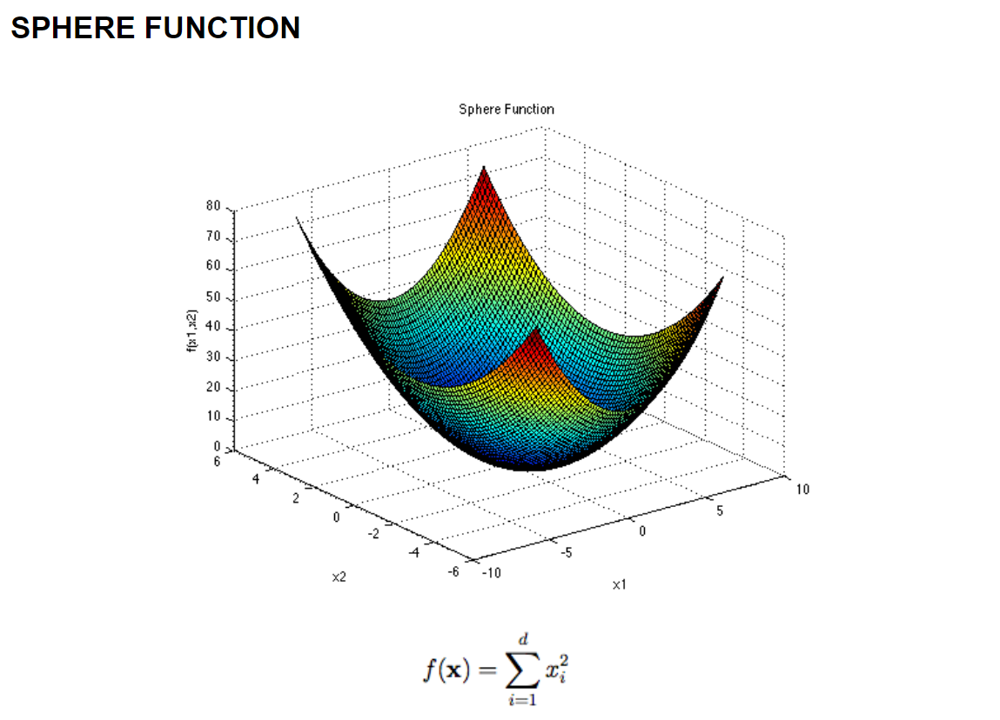

In [217]:
def Sphere_function(x1,x2,sigma_n=0.0):
    y=x1**2+x2**2
    y += np.random.normal(0, sigma_n, size=y.shape)
    return y

In [270]:
def initialize():
    noise=1e-4
    n=10        #number of samples 
    train_X1=np.random.uniform(-5.12,5.12,[n,1])
    train_X2=np.random.uniform(-5.12,5.12,[n,1])
    train_X=np.hstack((train_X1,train_X2))
    train_y = Sphere_function(train_X1,train_X2,noise)
    return train_X1,train_X2,train_X,train_y

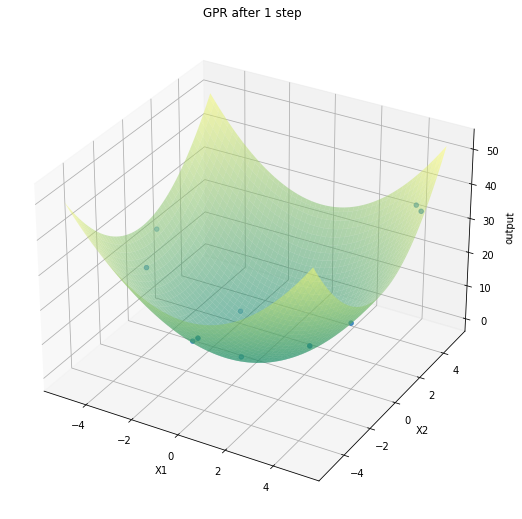

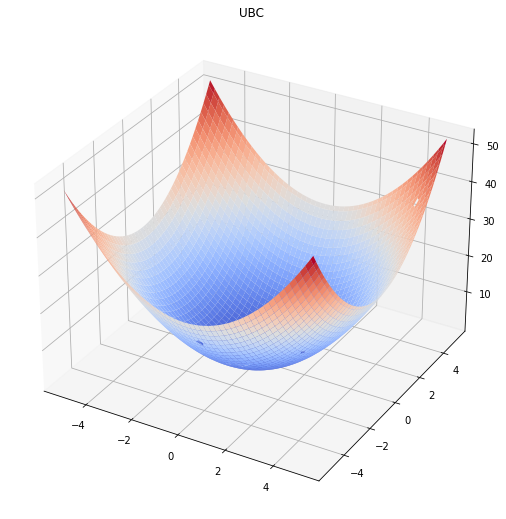

In [271]:
# experiement Sphere function
train_X1,train_X2,train_X,train_y=initialize()
copy_X1=train_X1
copy_X2=train_X2
X_test_d1=np.linspace(-5.12,5.12, 100).reshape(-1, 1)
X_test_d2 = np.linspace(-5.12, 5.12, 100).reshape(-1, 1)
X_test_d1, X_test_d2 = np.meshgrid(X_test_d1, X_test_d2)  # 构成网格面
test_X = [[d1, d2] for d1, d2 in zip(X_test_d1.ravel(), X_test_d2.ravel())]

gpr = GPR(optimize=True)
gpr.fit(train_X, train_y)
mu, cov = gpr.predict(test_X)
test_y = mu.ravel()
uncertainty = 1.96 * np.sqrt(np.diag(cov))
plot_2d(X_test_d1,X_test_d2,test_y,uncertainty,train_X,train_y,1)

After 4 iterations
fmin=f(-0.67,-0.57)=0.78


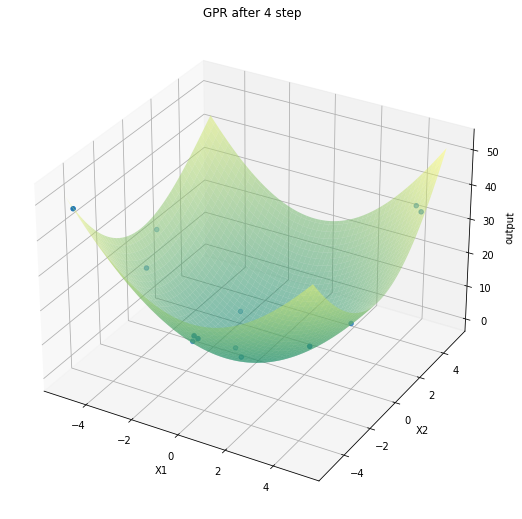

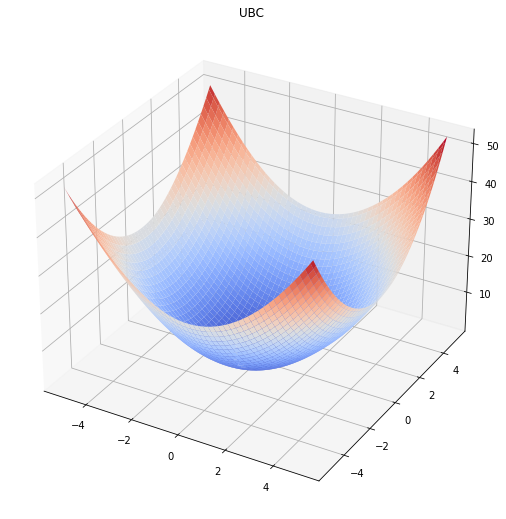

In [272]:
# 再做100步
gen=100
for i in range(gen):
    index=renew_2d(X_test_d1,test_y,uncertainty)
    train_X=np.append(train_X,np.array([X_test_d1[index],X_test_d2[index]])).reshape(-1,2)
    new_y=Sphere_function(X_test_d1[index],X_test_d2[index],1e-4)
    train_y = np.append(train_y,new_y).reshape(-1,1)
    gpr = GPR(optimize=True)
    gpr.fit(train_X, train_y)
    mu, cov = gpr.predict(test_X)
    test_y = mu.ravel()
    uncertainty = 1.96 * np.sqrt(np.diag(cov)) 
    if Sphere_function(X_test_d1[index],X_test_d2[index])<5 :
        print("After %d iterations"%(i+2))
        break
    
plot_2d(X_test_d1,X_test_d2,test_y,uncertainty,train_X,train_y,i+2)
print("fmin=f(%.2f,%.2f)=%.2f"
      %(X_test_d1[index],X_test_d2[index],Sphere_function(X_test_d1[index],X_test_d2[index])))

Compare with package

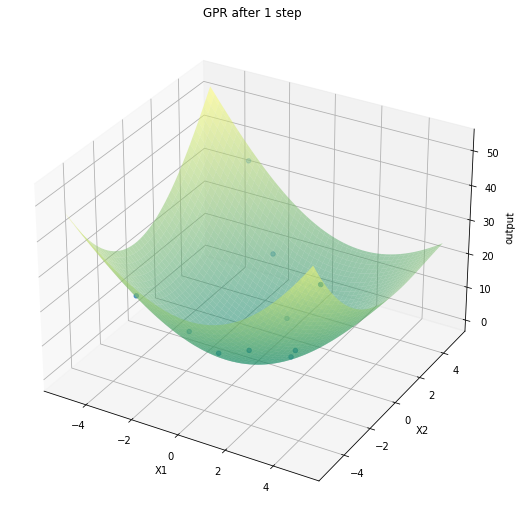

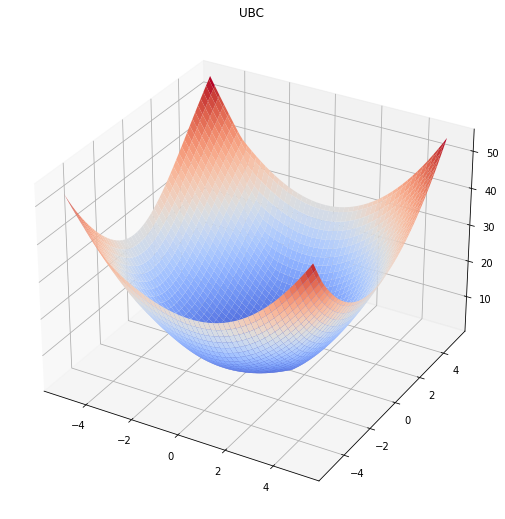

In [259]:
# experiement Buckin function
#train_X = np.array([[3, 1, 4, 5, 9],[4,5,6,7,10]]).T
train_X1=copy_X1
train_X2=copy_X2
train_X=np.hstack((train_X1,train_X2))
train_y = Sphere_function(train_X1,train_X2)
X_test_d1=np.linspace(-5.12,5.12, 100).reshape(-1, 1)
X_test_d2 = np.linspace(-5.12, 5.12, 100).reshape(-1, 1)
X_test_d1, X_test_d2 = np.meshgrid(X_test_d1, X_test_d2)  # 构成网格面
test_X = [[d1, d2] for d1, d2 in zip(X_test_d1.ravel(), X_test_d2.ravel())]

# 2-D与包作对比
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import ConstantKernel, RBF

# fit GPR
kernel = ConstantKernel(constant_value=0.1, constant_value_bounds=(1e-4, 1e4)) * RBF(length_scale=1., length_scale_bounds=(1e-4, 1e4))
gpr = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=2)
gpr.fit(train_X, train_y)
mu, cov = gpr.predict(test_X, return_cov=True)
test_y = mu.ravel()
uncertainty = 1.96 * np.sqrt(np.diag(cov))

plot_2d(X_test_d1,X_test_d2,test_y,uncertainty,train_X,train_y,1)

After 3 iterations
fmin=f(-0.26,0.05)=0.07


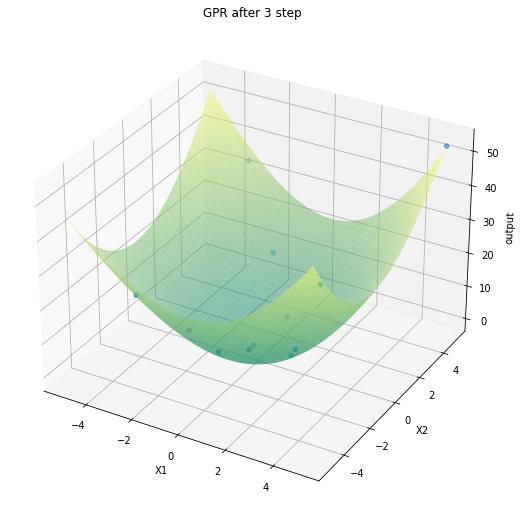

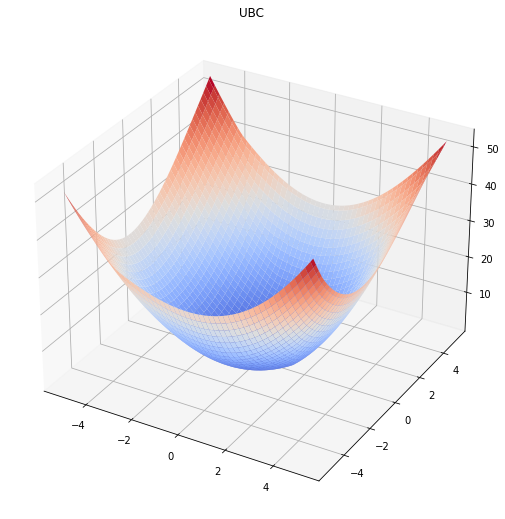

In [260]:
# 再做100步
gen=100
for i in range(gen):
    index=renew_2d(X_test_d1,test_y,uncertainty)
    train_X=np.append(train_X,np.array([X_test_d1[index],X_test_d2[index]])).reshape(-1,2)
    new_y=Sphere_function(X_test_d1[index],X_test_d2[index],1e-4)
    train_y = np.append(train_y,new_y).reshape(-1,1)
    gpr.fit(train_X, train_y)
    mu, cov = gpr.predict(test_X, return_cov=True)
    test_y = mu.ravel()
    uncertainty = 1.96 * np.sqrt(np.diag(cov))
    if Sphere_function(X_test_d1[index],X_test_d2[index])<5 :
        print("After %d iterations"%(i+2))
        break
        
plot_2d(X_test_d1,X_test_d2,test_y,uncertainty,train_X,train_y,i+2)
print("fmin=f(%.2f,%.2f)=%.2f"
      %(X_test_d1[index],X_test_d2[index],Sphere_function(X_test_d1[index],X_test_d2[index])))

## 定义plate-shaped函数

### booth function

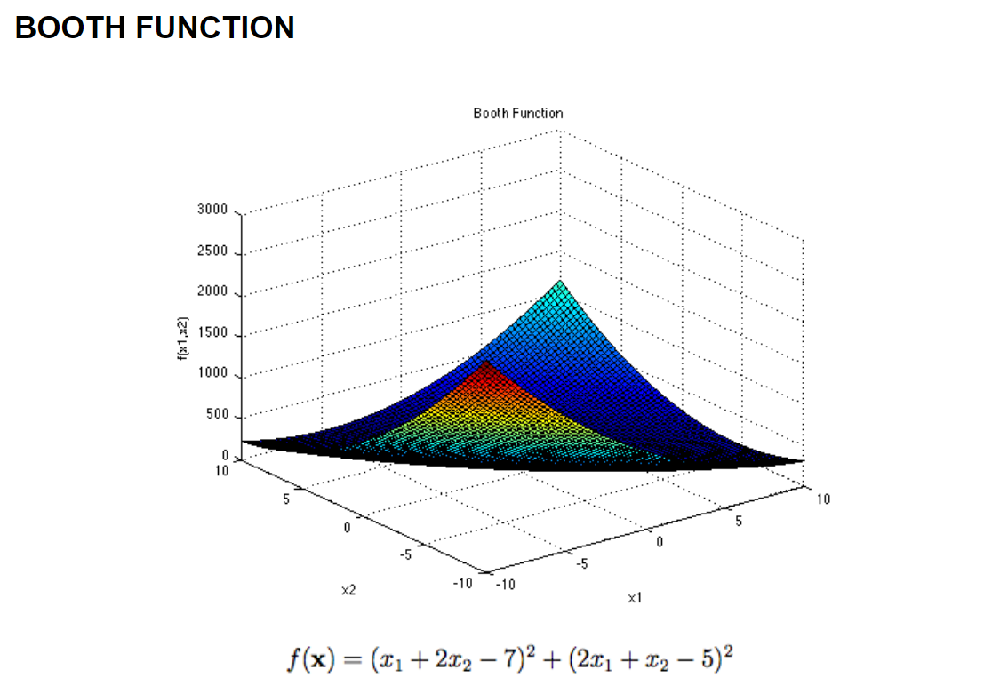

In [210]:
def Booth_function(x1,x2,sigma_n=0.0):
    y1=(x1+2*x2-7)**2
    y2=(2*x1+x2-5)**2
    y=y1+y2
    y=y+np.random.normal(0, sigma_n, size=y.shape)
    return y

In [308]:
global noise
noise=1e-4

In [357]:
def initialize():
    n=100        #number of samples 
    train_X1=np.random.uniform(-10,10,[n,1])
    train_X2=np.random.uniform(-10,10,[n,1])
    train_X=np.hstack((train_X1,train_X2))
    train_y = Booth_function(train_X1,train_X2,noise)
    return train_X1,train_X2,train_X,train_y

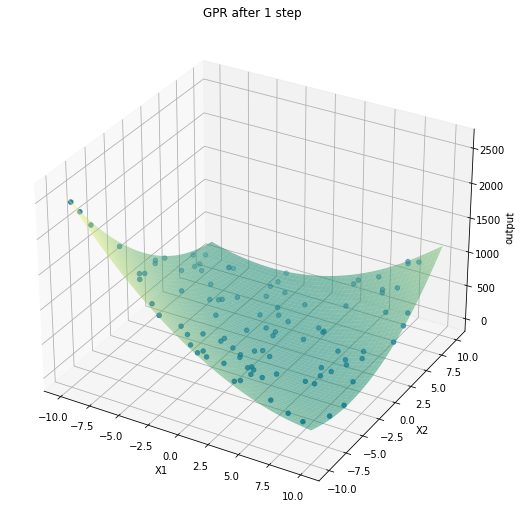

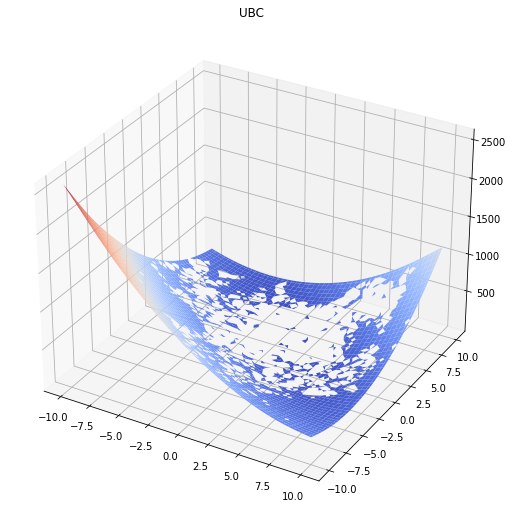

In [358]:
# experiement Sphere function
train_X1,train_X2,train_X,train_y=initialize()
copy_X1=train_X1
copy_X2=train_X2
X_test_d1=np.linspace(-10,10,100).reshape(-1, 1)
X_test_d2 = np.linspace(-10,10,100).reshape(-1, 1)
X_test_d1, X_test_d2 = np.meshgrid(X_test_d1, X_test_d2)  # 构成网格面
test_X = [[d1, d2] for d1, d2 in zip(X_test_d1.ravel(), X_test_d2.ravel())]

gpr = GPR(optimize=True)
gpr.fit(train_X, train_y)
mu, cov = gpr.predict(test_X)
test_y = mu.ravel()
uncertainty = 1.96 * np.sqrt(np.diag(cov))
plot_2d(X_test_d1,X_test_d2,test_y,uncertainty,train_X,train_y,1)

After 18 iterations
fmin=f(0.91,3.33)=0.35


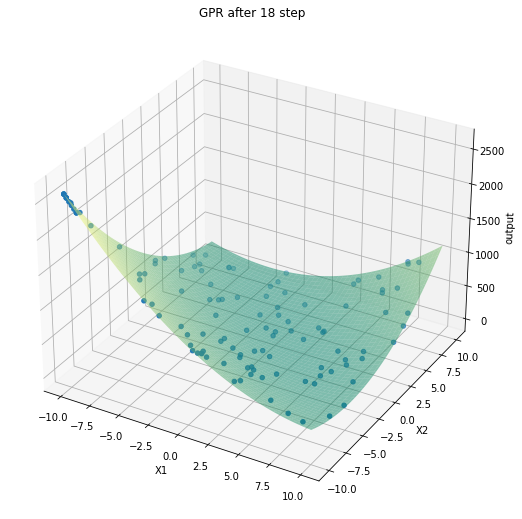

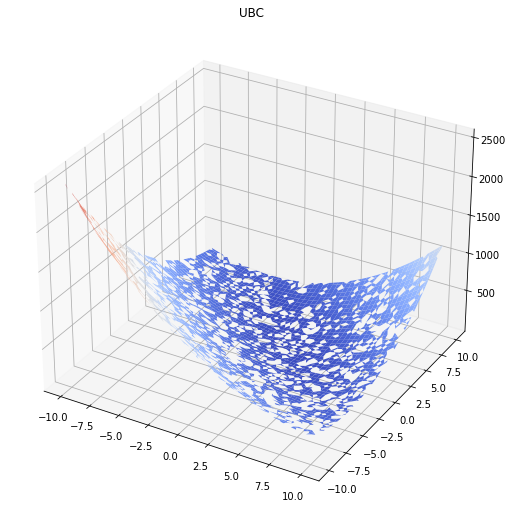

In [359]:
# 再做100步
gen=100
for i in range(gen):
    index=renew_2d(X_test_d1,test_y,uncertainty)
    train_X=np.append(train_X,np.array([X_test_d1[index],X_test_d2[index]])).reshape(-1,2)
    new_y=Booth_function(X_test_d1[index],X_test_d2[index],1e-4)
    train_y = np.append(train_y,new_y).reshape(-1,1)
    gpr = GPR(optimize=True)
    gpr.fit(train_X, train_y)
    mu, cov = gpr.predict(test_X)
    test_y = mu.ravel()
    uncertainty = 1.96 * np.sqrt(np.diag(cov)) 
    if Booth_function(X_test_d1[index],X_test_d2[index])<0.5 :
        print("After %d iterations"%(i+2))
        break
    
plot_2d(X_test_d1,X_test_d2,test_y,uncertainty,train_X,train_y,i+2)
print("fmin=f(%.2f,%.2f)=%.2f"
      %(X_test_d1[index],X_test_d2[index],Booth_function(X_test_d1[index],X_test_d2[index])))

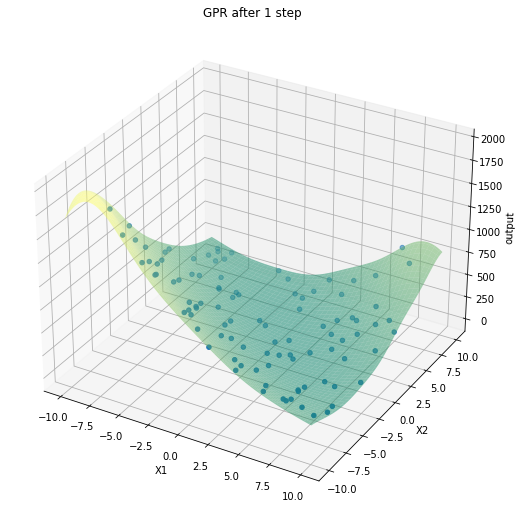

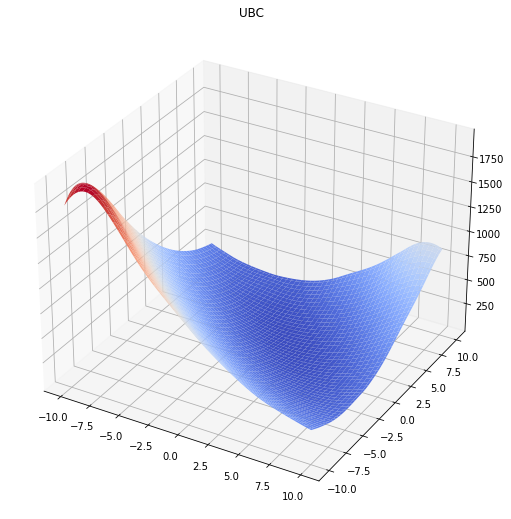

In [351]:
# experiement Buckin function
#train_X = np.array([[3, 1, 4, 5, 9],[4,5,6,7,10]]).T
train_X1=copy_X1
train_X2=copy_X2
train_X=np.hstack((train_X1,train_X2))
train_y = Booth_function(train_X1,train_X2,1e-4)
X_test_d1=np.linspace(-10,10, 100).reshape(-1, 1)
X_test_d2 = np.linspace(-10, 10, 100).reshape(-1, 1)
X_test_d1, X_test_d2 = np.meshgrid(X_test_d1, X_test_d2)  # 构成网格面
test_X = [[d1, d2] for d1, d2 in zip(X_test_d1.ravel(), X_test_d2.ravel())]

# 2-D与包作对比
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import ConstantKernel, RBF

# fit GPR
kernel = ConstantKernel(constant_value=0.1, constant_value_bounds=(1e-4, 1e4)) * RBF(length_scale=1., length_scale_bounds=(1e-4, 1e4))
gpr = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=2)
gpr.fit(train_X, train_y)
mu, cov = gpr.predict(test_X, return_cov=True)
test_y = mu.ravel()
uncertainty = 1.96 * np.sqrt(np.diag(cov))

plot_2d(X_test_d1,X_test_d2,test_y,uncertainty,train_X,train_y,1)

After 2 iterations
fmin=f(0.71,3.33)=0.20


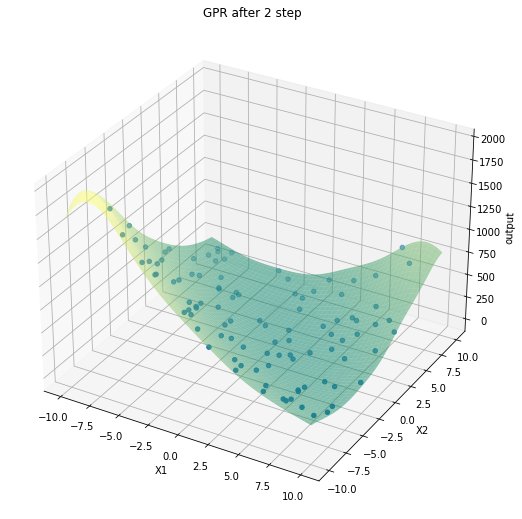

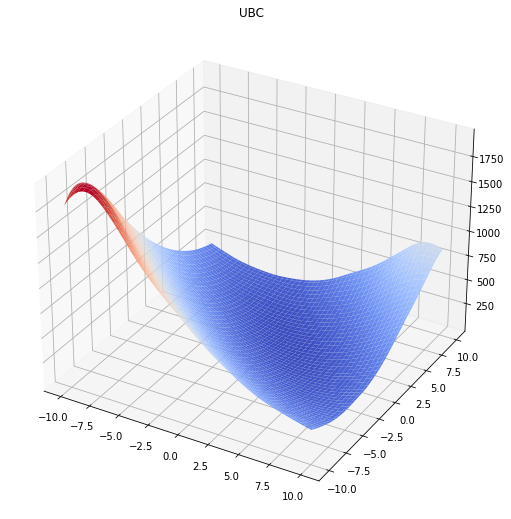

In [352]:
# 再做100步
gen=100
for i in range(gen):
    index=renew_2d(X_test_d1,test_y,uncertainty)
    train_X=np.append(train_X,np.array([X_test_d1[index],X_test_d2[index]])).reshape(-1,2)
    new_y=Booth_function(X_test_d1[index],X_test_d2[index],1e-4)
    train_y = np.append(train_y,new_y).reshape(-1,1)
    gpr.fit(train_X, train_y)
    mu, cov = gpr.predict(test_X, return_cov=True)
    test_y = mu.ravel()
    uncertainty = 1.96 * np.sqrt(np.diag(cov))
    if Booth_function(X_test_d1[index],X_test_d2[index])<5 :
        print("After %d iterations"%(i+2))
        break
        
plot_2d(X_test_d1,X_test_d2,test_y,uncertainty,train_X,train_y,i+2)
print("fmin=f(%.2f,%.2f)=%.2f"
      %(X_test_d1[index],X_test_d2[index],Booth_function(X_test_d1[index],X_test_d2[index])))

## 定义valley-shaped函数

### Dixon-price function

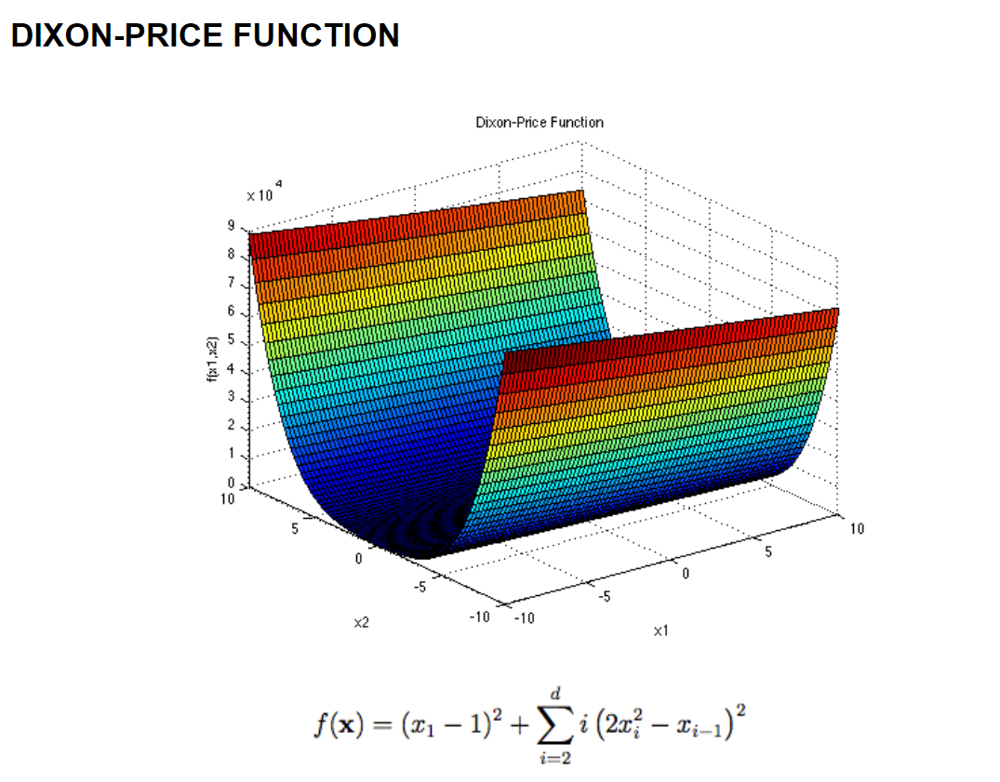

In [360]:
def Dixon_function(x1,x2,sigma_n):
    y=(x1-1)**2+2*(2*x2**2-x1)**2
    y+=np.random.normal(0, sigma_n, size=y.shape)
    return y

In [361]:
global noise
noise=1e-4

In [379]:
def initialize():
    n=100        #number of samples 
    train_X1=np.random.uniform(-10,10,[n,1])
    train_X2=np.random.uniform(-10,10,[n,1])
    train_X=np.hstack((train_X1,train_X2))
    train_y = Dixon_function(train_X1,train_X2,noise)
    return train_X1,train_X2,train_X,train_y

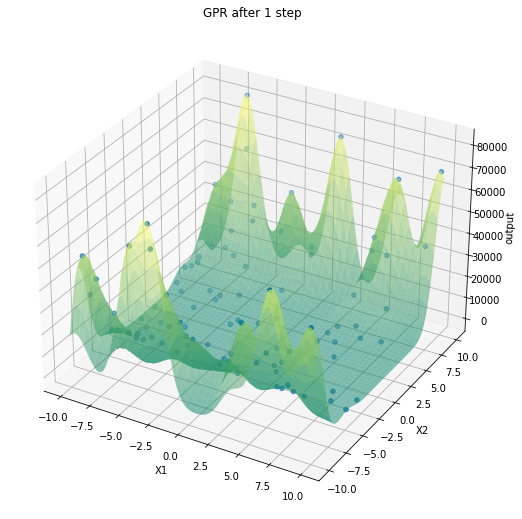

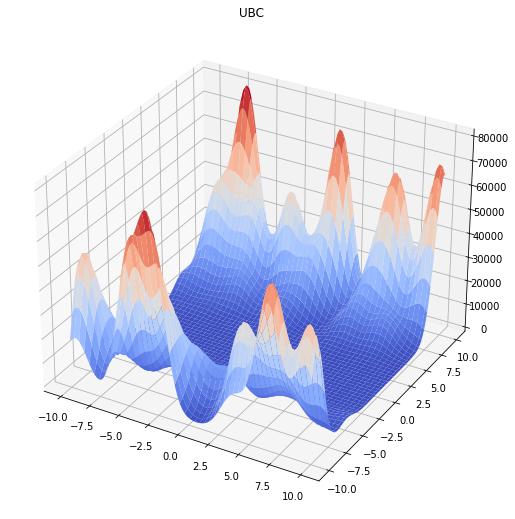

In [382]:
# experiement Sphere function
train_X1,train_X2,train_X,train_y=initialize()
copy_X1=train_X1
copy_X2=train_X2
X_test_d1=np.linspace(-10,10,100).reshape(-1, 1)
X_test_d2 = np.linspace(-10,10,100).reshape(-1, 1)
X_test_d1, X_test_d2 = np.meshgrid(X_test_d1, X_test_d2)  # 构成网格面
test_X = [[d1, d2] for d1, d2 in zip(X_test_d1.ravel(), X_test_d2.ravel())]

gpr = GPR(optimize=True)
gpr.fit(train_X, train_y)
mu, cov = gpr.predict(test_X)
test_y = mu.ravel()
uncertainty = 1.96 * np.sqrt(np.diag(cov))
plot_2d(X_test_d1,X_test_d2,test_y,uncertainty,train_X,train_y,1)

After 7 iterations
fmin=f(1.52,-0.91)=0.30


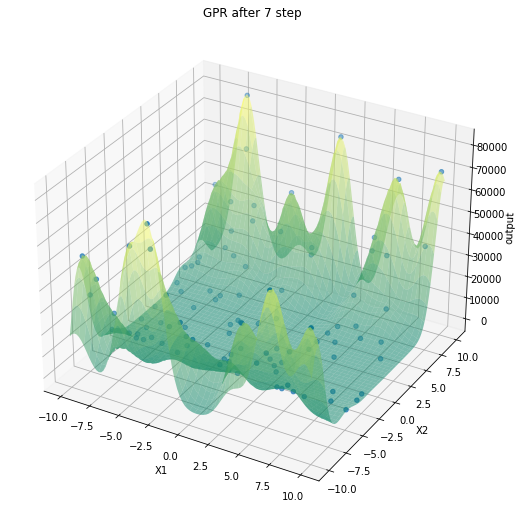

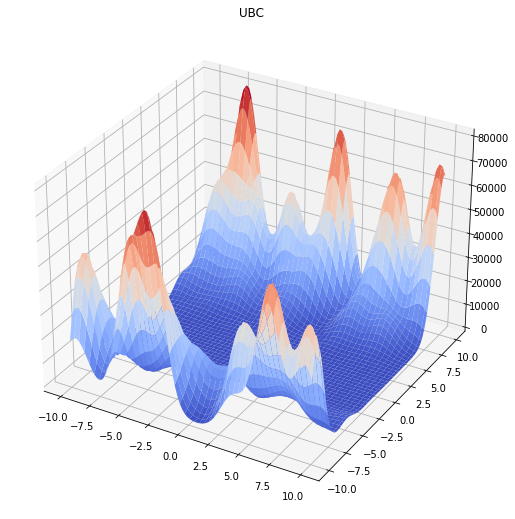

In [383]:
# 再做100步
gen=100
for i in range(gen):
    index=renew_2d(X_test_d1,test_y,uncertainty)
    train_X=np.append(train_X,np.array([X_test_d1[index],X_test_d2[index]])).reshape(-1,2)
    new_y=Dixon_function(X_test_d1[index],X_test_d2[index],1e-4)
    train_y = np.append(train_y,new_y).reshape(-1,1)
    gpr = GPR(optimize=True)
    gpr.fit(train_X, train_y)
    mu, cov = gpr.predict(test_X)
    test_y = mu.ravel()
    uncertainty = 1.96 * np.sqrt(np.diag(cov)) 
    if Dixon_function(X_test_d1[index],X_test_d2[index],1e-4)<0.5 :
        print("After %d iterations"%(i+2))
        break
    
plot_2d(X_test_d1,X_test_d2,test_y,uncertainty,train_X,train_y,i+2)
print("fmin=f(%.2f,%.2f)=%.2f"
      %(X_test_d1[index],X_test_d2[index],Dixon_function(X_test_d1[index],X_test_d2[index],1e-4)))

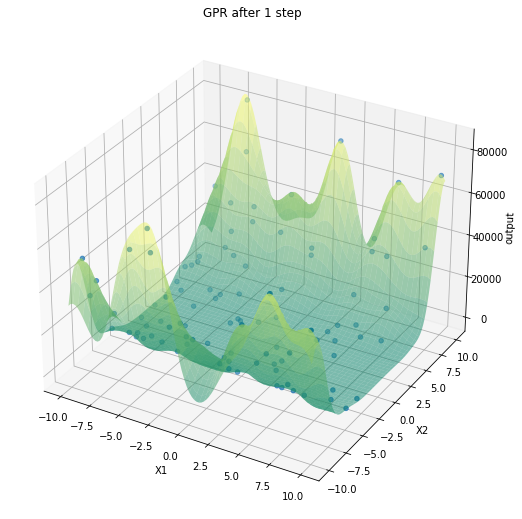

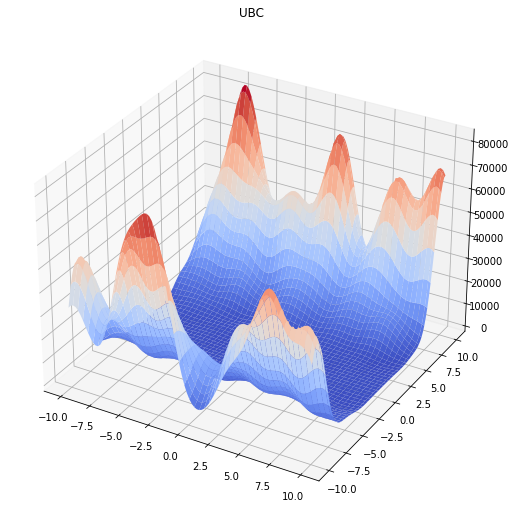

In [384]:
# experiement Buckin function
#train_X = np.array([[3, 1, 4, 5, 9],[4,5,6,7,10]]).T
train_X1=copy_X1
train_X2=copy_X2
train_X=np.hstack((train_X1,train_X2))
train_y = Dixon_function(train_X1,train_X2,1e-4)
X_test_d1=np.linspace(-10,10, 100).reshape(-1, 1)
X_test_d2 = np.linspace(-10, 10, 100).reshape(-1, 1)
X_test_d1, X_test_d2 = np.meshgrid(X_test_d1, X_test_d2)  # 构成网格面
test_X = [[d1, d2] for d1, d2 in zip(X_test_d1.ravel(), X_test_d2.ravel())]

# 2-D与包作对比
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import ConstantKernel, RBF

# fit GPR
kernel = ConstantKernel(constant_value=0.1, constant_value_bounds=(1e-4, 1e4)) * RBF(length_scale=1., length_scale_bounds=(1e-4, 1e4))
gpr = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=2)
gpr.fit(train_X, train_y)
mu, cov = gpr.predict(test_X, return_cov=True)
test_y = mu.ravel()
uncertainty = 1.96 * np.sqrt(np.diag(cov))

plot_2d(X_test_d1,X_test_d2,test_y,uncertainty,train_X,train_y,1)

After 14 iterations
fmin=f(1.52,-0.51)=2.29


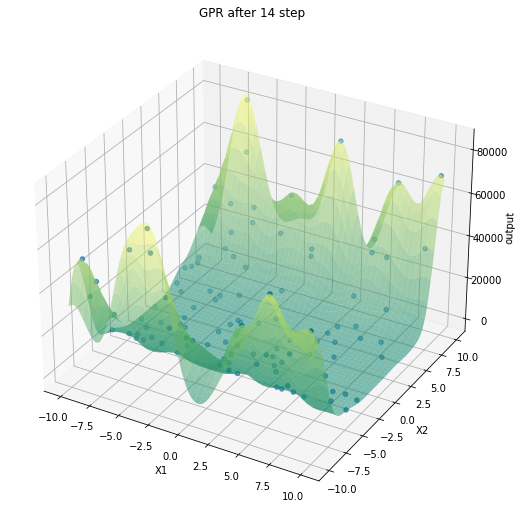

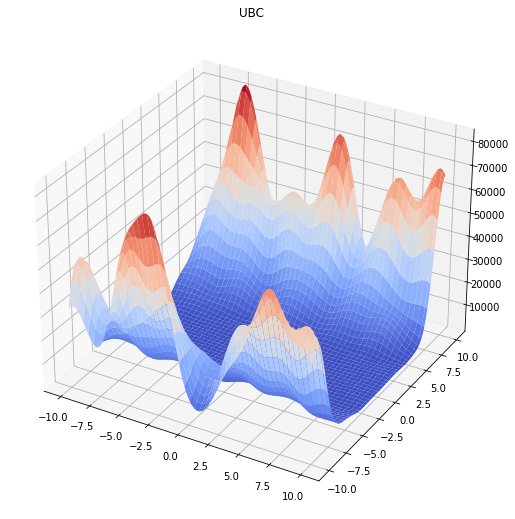

In [385]:
# 再做100步
gen=100
for i in range(gen):
    index=renew_2d(X_test_d1,test_y,uncertainty)
    train_X=np.append(train_X,np.array([X_test_d1[index],X_test_d2[index]])).reshape(-1,2)
    new_y=Dixon_function(X_test_d1[index],X_test_d2[index],1e-4)
    train_y = np.append(train_y,new_y).reshape(-1,1)
    gpr.fit(train_X, train_y)
    mu, cov = gpr.predict(test_X, return_cov=True)
    test_y = mu.ravel()
    uncertainty = 1.96 * np.sqrt(np.diag(cov))
    if Dixon_function(X_test_d1[index],X_test_d2[index],1e-4)<.5 :
        print("After %d iterations"%(i+2))
        break
        
plot_2d(X_test_d1,X_test_d2,test_y,uncertainty,train_X,train_y,i+2)
print("fmin=f(%.2f,%.2f)=%.2f"
      %(X_test_d1[index],X_test_d2[index],Dixon_function(X_test_d1[index],X_test_d2[index],1e-4)))

## 定义Steep-ridge函数

### Easom function

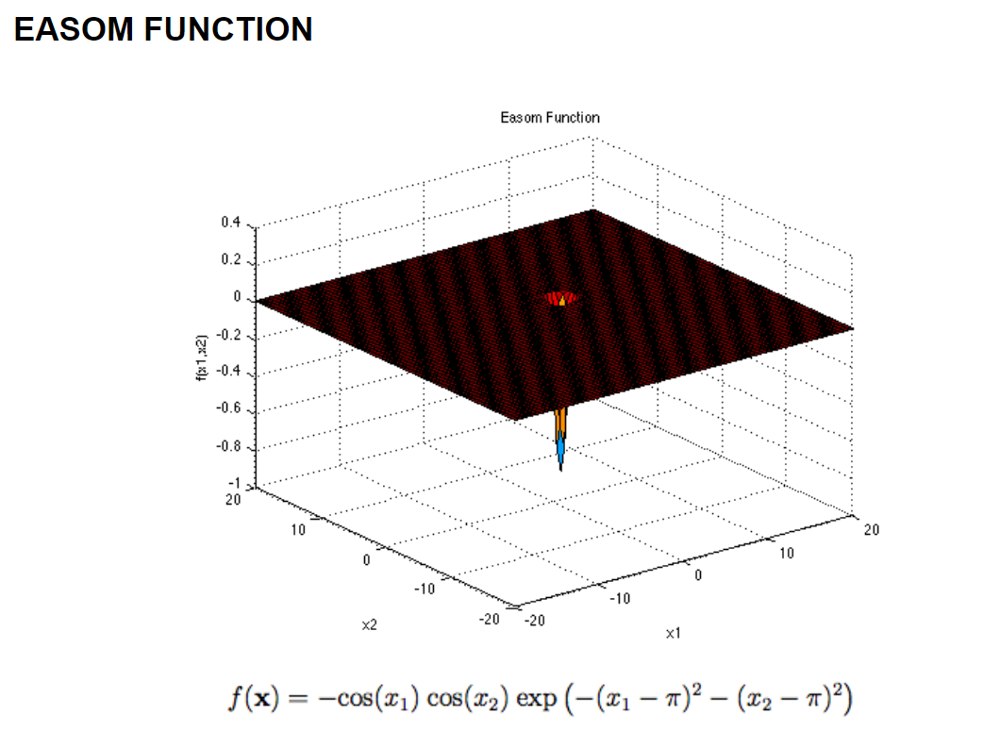

In [398]:
def Easom_function(x1,x2,sigma_n=0.0):
    y=-np.cos(x1)*np.cos(x2)*np.exp(-(x1-np.pi)**2-(x2-np.pi)**2)
    y+=np.random.normal(0, sigma_n, size=y.shape)
    return y

In [399]:
global noise
noise=0.

In [407]:
def initialize():
    n=2000        #number of samples 
    train_X1=np.random.uniform(-10,10,[n,1])
    train_X2=np.random.uniform(-10,10,[n,1])
    train_X=np.hstack((train_X1,train_X2))
    train_y = Easom_function(train_X1,train_X2,noise)
    return train_X1,train_X2,train_X,train_y

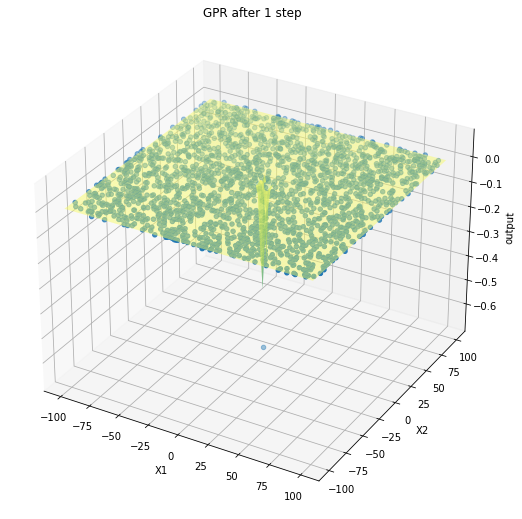

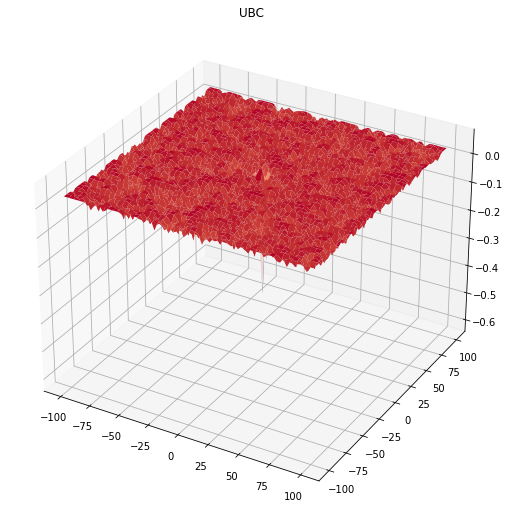

In [408]:
# experiement Sphere function
train_X1,train_X2,train_X,train_y=initialize()
copy_X1=train_X1
copy_X2=train_X2
X_test_d1=np.linspace(-10,10,100).reshape(-1, 1)
X_test_d2 = np.linspace(-10,10,100).reshape(-1, 1)
X_test_d1, X_test_d2 = np.meshgrid(X_test_d1, X_test_d2)  # 构成网格面
test_X = [[d1, d2] for d1, d2 in zip(X_test_d1.ravel(), X_test_d2.ravel())]

gpr = GPR(optimize=True)
gpr.fit(train_X, train_y)
mu, cov = gpr.predict(test_X)
test_y = mu.ravel()
uncertainty = 1.96 * np.sqrt(np.diag(cov))
plot_2d(X_test_d1,X_test_d2,test_y,uncertainty,train_X,train_y,1)

After 2 iterations
fmin=f(3.03,3.03)=-0.96


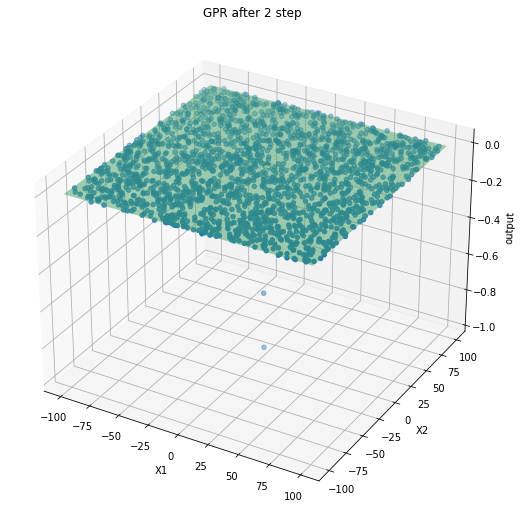

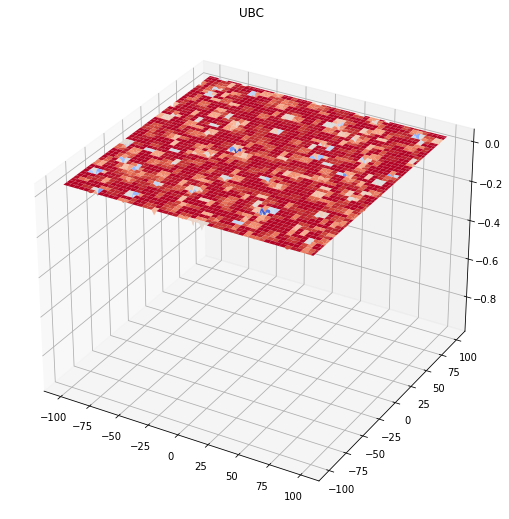

In [409]:
# 再做100步
gen=100
for i in range(gen):
    index=renew_2d(X_test_d1,test_y,uncertainty)
    train_X=np.append(train_X,np.array([X_test_d1[index],X_test_d2[index]])).reshape(-1,2)
    new_y=Easom_function(X_test_d1[index],X_test_d2[index],noise)
    train_y = np.append(train_y,new_y).reshape(-1,1)
    gpr = GPR(optimize=True)
    gpr.fit(train_X, train_y)
    mu, cov = gpr.predict(test_X)
    test_y = mu.ravel()
    uncertainty = 1.96 * np.sqrt(np.diag(cov)) 
    if Easom_function(X_test_d1[index],X_test_d2[index],noise)<-0.5 :
        print("After %d iterations"%(i+2))
        break
    
plot_2d(X_test_d1,X_test_d2,test_y,uncertainty,train_X,train_y,i+2)
print("fmin=f(%.2f,%.2f)=%.2f"
      %(X_test_d1[index],X_test_d2[index],Easom_function(X_test_d1[index],X_test_d2[index],noise)))

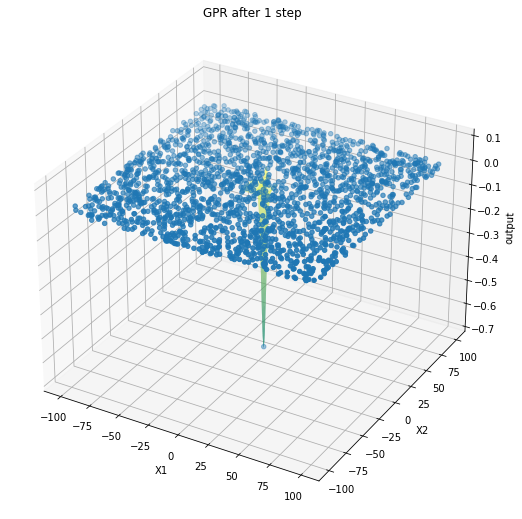

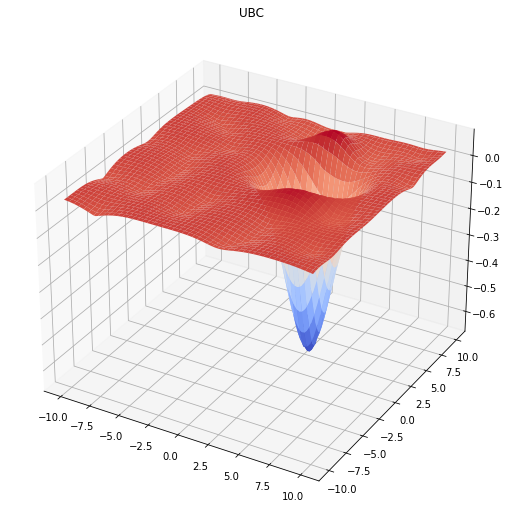

In [414]:
# experiement Buckin function
#train_X = np.array([[3, 1, 4, 5, 9],[4,5,6,7,10]]).T
train_X1=copy_X1
train_X2=copy_X2
train_X=np.hstack((train_X1,train_X2))
train_y = Easom_function(train_X1,train_X2,noise)
X_test_d1=np.linspace(-10,10, 100).reshape(-1, 1)
X_test_d2 = np.linspace(-10, 10, 100).reshape(-1, 1)
X_test_d1, X_test_d2 = np.meshgrid(X_test_d1, X_test_d2)  # 构成网格面
test_X = [[d1, d2] for d1, d2 in zip(X_test_d1.ravel(), X_test_d2.ravel())]

# 2-D与包作对比
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import ConstantKernel, RBF

# fit GPR
kernel = ConstantKernel(constant_value=0.1, constant_value_bounds=(1e-4, 1e4)) * RBF(length_scale=1., length_scale_bounds=(1e-4, 1e4))
gpr = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=2)
gpr.fit(train_X, train_y)
mu, cov = gpr.predict(test_X, return_cov=True)
test_y = mu.ravel()
uncertainty = 1.96 * np.sqrt(np.diag(cov))

plot_2d(X_test_d1,X_test_d2,test_y,uncertainty,train_X,train_y,1)

After 7 iterations
fmin=f(2.93,2.73)=-0.72


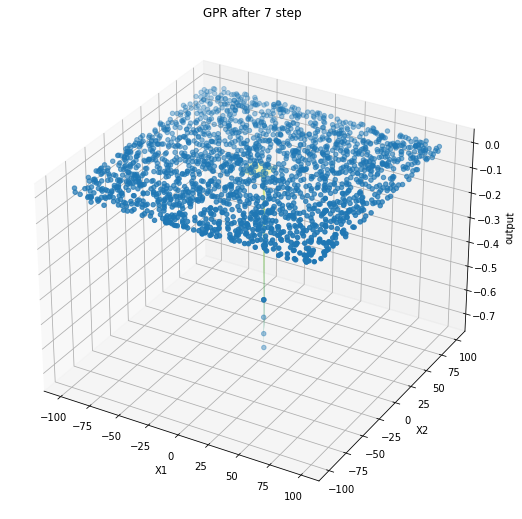

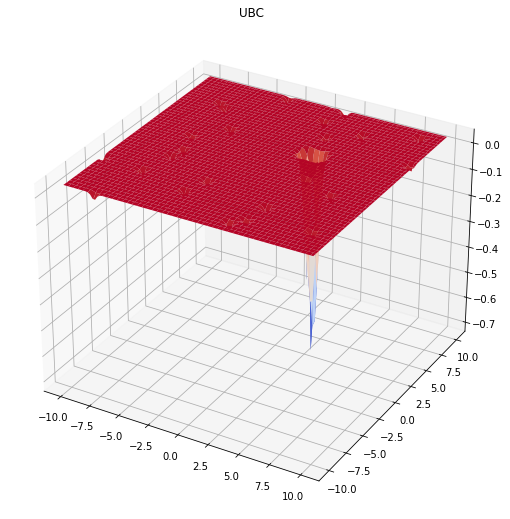

In [415]:
# 再做100步
gen=100
for i in range(gen):
    index=renew_2d(X_test_d1,test_y,uncertainty)
    train_X=np.append(train_X,np.array([X_test_d1[index],X_test_d2[index]])).reshape(-1,2)
    new_y=Easom_function(X_test_d1[index],X_test_d2[index],noise)
    train_y = np.append(train_y,new_y).reshape(-1,1)
    gpr.fit(train_X, train_y)
    mu, cov = gpr.predict(test_X, return_cov=True)
    test_y = mu.ravel()
    uncertainty = 1.96 * np.sqrt(np.diag(cov))
    if Easom_function(X_test_d1[index],X_test_d2[index],noise)<-0.7 :
        print("After %d iterations"%(i+2))
        break
        
plot_2d(X_test_d1,X_test_d2,test_y,uncertainty,train_X,train_y,i+2)
print("fmin=f(%.2f,%.2f)=%.2f"
      %(X_test_d1[index],X_test_d2[index],Easom_function(X_test_d1[index],X_test_d2[index],noise)))